# Who feeds the world ? And how wealthy are they ?
There are **folium maps** in this notebook. If they do not display or do not display well, we suggest you to **have a look at the `.html` file** that is located the same repository.

## Abstract <a name="abstract"></a>

Are countries that plant more maize richer than countries planting rice? Is it true that developed countries produce more meat? Are you better off being a food net exporter or importer? Are food prices more stable if you produce more food locally or trade more?

In this project we analyze **the effects that a country agricultural sector has on its different economic indicators**. The indicators of the agricultural sector we used are crops and livestock **production, exports and imports** of **crops, livestock and live animals**. For these, we use the data from the "**Global Food & Agriculture Statistics**" datasets. We quantify the **economic success** by **Gross Domestic Product (GDP)**, but also by **price stability**, as defined by low changes in **Consumer Price Indices (CPI)**. We further use the **Food and Agriculture Organization (FAO)** definition of **food self-sufficiency** to analyze its link to economic success and stability. 
After finding the results of the agricultural products most highly linked with economic success, we create **visualizations** in the form of **maps**. Through these timeline maps, we show how the production/export/import of important products has developed globally. We also use maps to visualize the **level of food self-sufficiency and price stability**.




## Research questions <a name="abstract2"></a>

We would like to work on the following research questions:

- Which **agricultural products** are the **most produced/exported/imported** globally?
- Which of them are **correlated more highly with GDP**?
- Can we **predict** which countries will have **further GDP growth** based on the repartition of their agricultural sector?
- How can we define **price stability**? How can we define **food self-sufficiency**? Is there a link?
- What is countries **agricultural trade balance**? Are countries that are net exporters or importers richer ? Are self-sufficient countries **richer** ?
- How does the geographical repartition of important agricultural products look like? Which countries are **net food exporters or importers**? How did this **evolve over the last few decades** ?


# Table of contents <a name="toc"></a>


[Abstract](#abstract)

[Research questions](#abstract2) 

[Table of contents](#toc)

1. [Data cleansing and preprocessing](#1)

    1. [Dataset description](#1A)   
    
    2. [Loading the data set](#1B)
    
    3. [Understanding the data set](#1C)
    
    4. [Cleansing the data set](#1D)
        
    5. [Preprocessing the data set](#1E)
        
    6. [Making one uniformized dataframe](#1F)
    
    7. [The last filter](#1G)
        
2. [Data exploration and first observations](#2)
        
    1. [Food productions, importations and exportations](#2A)
            
    2. [Consumer price indices](#2B)  
                
    3. [Structure of international trade and historical context](#2C)      
        
    4. [Economic classification of countries](#2D)    
        
3. [Descriptive data analysis](#3)

    1. [Production and consumption of food from a time-space geography point of view](#3A)

    2. [Food self-sufficiency](#3B)

    3. [Analysis of food production and trade with GDP](#3C)

    4. [Food prices stability and agricultural features](#3D)      

4. [Informed plan for next actions](#4)

**External imports:**

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import folium
import seaborn as sns
import json
import re
import requests
from bs4 import BeautifulSoup
from ipywidgets import interact
from IPython.display import display
import scipy.cluster.hierarchy as spc
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import Ridge
from operator import itemgetter
from sklearn import preprocessing
from tqdm import tqdm

**Setup:**

In [2]:
data_folder_path = "Scripts/Data/current_FAO/raw_files/"

files = {"Crops production" : "Production_Crops_E_All_Data_(Normalized).csv",
         "Food trade" : "Trade_Crops_Livestock_E_All_Data_(Normalized).csv", 
         "Consumer price indices" : "ConsumerPriceIndices_E_All_Data_(Normalized).csv",
         "Macroeconomy" : "Macro-Statistics_Key_Indicators_E_All_Data_(Normalized).csv",
         "Livestock production" : "Production_Livestock_E_All_Data_(Normalized).csv",
         "Live animals trade" : "Trade_LiveAnimals_E_All_Data_(Normalized).csv"
        }
interesting_datasets = files.keys()

## 1. Data cleansing and preprocessing <a name="1"></a>

In this part, we will load, explore and clean the dataset in order to remove typing errors, missing information, inaccuracies, and so on.

1. 

    1. [Dataset description](#1A)   
    
    2. [Loading the data set](#1B)
    
    3. [Understanding the data set](#1C)
    
    4. [Cleansing the data set](#1D)
    
        1. [Removing unuseful data](#1Da)         
        
        2. [Handling of the missing data](#1Db)       
        
    5. [Preprocessing the data set](#1E)
    
        1. [Converting country names between different naming conventions](#1Ea)
        
        2. [Normalization and log scales](#1Eb)
        
    6. [Making one uniformized dataframe](#1F)

### 1.A. Dataset description <a name="1A"></a>

Our main dataset is a subset of the **"Global Food & Agriculture Statistics"** that is found **in the proposed datasets list**. In this dataset, we have seen that we could work with the **production** as well as **import** and **export** quantities **per year** and **per country**. As far as food is concerned, we use **crops**, **livestock** and **live animals**. We have also found pieces of information about countries **GDP** and **CPI** in this database.

This database countains several files. We had a look of all the files. For food-related data about countries, we decided to focus on the following files:
- `Production_Crops_E_All_Data_(Normalized).csv` contains data about **crops production**.
- `Trade_Crops_Livestock_E_All_Data_(Normalized).csv` contains data about **food trade** (crops and livestock).
- `Production_Livestock_E_All_Data_(Normalized).csv` contains data about **livestock production**.
- `Trade_LiveAnimals_E_All_Data_(Normalized).csv` contains data about **live animals trade**.

For food-related data about countries, we decided to focus on the following files:
- `ConsumerPriceIndices_E_All_Data_(Normalized).csv` contains data about **consumer price indices (CPI)**.
- `Macro-Statistics_Key_Indicators_E_All_Data_(Normalized).csv` contains data about **gross domestic product (GDP)** along with other macroeconomic indicators.

### 1.B. Loading the data set  <a name="1B"></a>

In [3]:
def load_datasets(datasets) :
    df = {}
    for dataset in datasets :
        file_path = data_folder_path + files[dataset]
        df[dataset] = pd.read_csv(file_path, encoding = "ISO-8859-1")
    return df

We **load each interresting dataset** in the dictionary `df` :

In [4]:
df = load_datasets(interesting_datasets)

### 1.C. Understanding the data set  <a name="1C"></a>

In this part, we will have a first look of the datasets in order to **get a first sense of the data**.

In [5]:
def display_df(df, datasets):
    for dataset in datasets :
        display(dataset, df[dataset].sample(5))

In order to see what does the datasets look like, we display a sample of 5 rows for each of them :

In [6]:
display_df(df, interesting_datasets)

'Crops production'

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
1547790,203,Spain,554,Cranberries,5510,Production,1962,1962,tonnes,NaN,M
1209680,156,New Zealand,826,"Tobacco, unmanufactured",5510,Production,2003,2003,tonnes,0.0,NaN
2184312,5301,Central Asia,260,Olives,5419,Yield,2011,2011,hg/ha,10194.0,Fc
2040705,5200,Americas,101,Canary seed,5525,Seed,1982,1982,tonnes,2253.0,A
1404462,182,Réunion,414,"Beans, green",5312,Area harvested,1967,1967,ha,500.0,F


'Food trade'

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
7577309,162,Norway,372,Lettuce and chicory,5610,Import Quantity,1983,1983,tonnes,888.0,NaN
5795963,118,Kuwait,1069,"Meat, duck",5610,Import Quantity,2003,2003,tonnes,NaN,M
315518,9,Argentina,544,Strawberries,5610,Import Quantity,1970,1970,tonnes,0.0,NaN
872956,14,Barbados,1949,Oranges+Tang+Clem,5910,Export Quantity,1970,1970,tonnes,0.0,A
9896937,210,Sweden,1893,Miscellaneous Food,5922,Export Value,1975,1975,1000 US$,18071.0,A


'Consumer price indices'

,Area Code,Area,Item Code,Item,Months Code,Months,Year Code,Year,Unit,Value,Flag,Note
48221,196,Seychelles,23012,"Consumer Prices, General Indices (2010 = 100)",7002,February,2006,2006,NaN,53.838197,X,2010
19980,73,Georgia,23012,"Consumer Prices, General Indices (2010 = 100)",7012,December,2016,2016,NaN,119.048300,X,2010
38883,158,Niger,23012,"Consumer Prices, General Indices (2010 = 100)",7007,July,2005,2005,NaN,92.612183,X,2010
45202,184,Rwanda,23012,"Consumer Prices, General Indices (2010 = 100)",7009,September,2005,2005,NaN,65.868903,X,2010
16505,60,El Salvador,23012,"Consumer Prices, General Indices (2010 = 100)",7001,January,2017,2017,NaN,109.196122,X,2010


'Macroeconomy'

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
98797,40,Chile,22077,Value Added (Manufacture of food and beverages),6109,Value Local Currency,2003,2003,millions,NaN,NaN
560645,5502,Melanesia,22016,"Value Added (Agriculture, Forestry and Fishing)",6103,Share of GDP in US$,1984,1984,%,20.432359,Fc
301231,138,Mexico,22008,Gross Domestic Product,6156,"Annual growth Local Currency, 2005 prices",1998,1998,%,5.030376,Fc
362270,166,Panama,22016,"Value Added (Agriculture, Forestry and Fishing)",6156,"Annual growth Local Currency, 2005 prices",2012,2012,%,0.973634,Fc
94756,39,Chad,22015,Gross Fixed Capital Formation,6103,Share of GDP in US$,2006,2006,%,22.296481,Fc


'Livestock production'

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
64704,113,Kyrgyzstan,1126,Camels,5111,Stocks,1993,1993,Head,500.0,F
134045,5103,Northern Africa,1057,Chickens,5112,Stocks,2008,2008,1000 Head,526902.0,A
22094,39,Chad,1057,Chickens,5112,Stocks,1975,1975,1000 Head,2600.0,F
138180,5203,Northern America,1034,Pigs,5111,Stocks,1973,1973,Head,66224576.0,A
80644,149,Nepal,1034,Pigs,5111,Stocks,1977,1977,Head,348000.0,NaN


'Live animals trade'

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
210200,95,Honduras,1016,Goats,5622,Import Value,2002,2002,1000 US$,7.0,NaN
505582,249,Yemen,866,Cattle,5622,Import Value,1962,1962,1000 US$,90.0,NaN
73120,233,Burkina Faso,1096,Horses,5622,Import Value,1995,1995,1000 US$,71.0,NaN
92392,39,Chad,1884,Live Animals,5622,Import Value,1975,1975,1000 US$,0.0,A
35970,14,Barbados,1057,Chickens,5609,Import Quantity,1997,1997,1000 Head,0.0,*


At first glance, our datasets **seem very clean**.

Each of our dataset contains **a column "Year"** and a column that is named **"Area"**. This is a great news for us since we want to do a both **geographical and time-related analysis**.

The column **"Area"** correspond to the country except it **may contains a group of country** (e.g. "Eastern Europe").

### 1.D. Cleansing the data set  <a name="1D"></a>

In this part, we will **clean the datasets**. The **final goal is to produce one uniformized dataset** on which we could work (see [1.F.](#1F)).

In a very simplistic way, such a cleaned and uniformized dataset may look like this :

    Country | Year | GDP | CPI | Food production features | Food trade features

1.  
    4. 
    
        1. [Removing unusefull data](#1Da)         
    
            1. [Extracting GDP from the "Macroeconomy" dataset](#1Dai)
            
            2. [Extracting crops harvested area, production, seed and yield from the "Crops production" dataset](#1Daii)
            
            3. [Extracting stocks production from the "Livestock production" dataset](#1Daiii)
            
            4. [Extracting import and export quantities from the "Live animals trade" and "Crops trade" datasets](#1Daiv)
            5. [Extracting average CPI of each year from the "Consumer price indices" dataset](#1Dav)
            
            6. [Removing areas which are not countries](#1Davi)
        
        2. [Handling of the missing data](#1Db)
        
            1. [Highlighting the problem](#1Dbi)
            
            2. [Proposed correction](#1Dbii)     

#### 1.D.a. Removing unuseful data  <a name="1Da"></a>

In this section, we will create dataframes in `df_useful` which correspond to previous dataframes **without the unuseful data**.

In [7]:
df_useful = {}

##### 1.D.a.i. Extracting GDP from the "Macroeconomy" dataset <a name="1Dai"></a>
The "Macroeconomy" dataset contains **many different measures**: Gross Fixed Capital Formation, Gross National Income, Value Added (Total Manufacturing), ... We are **only interested in Gross Domestic Product**. Therefore, we extract it Gross Domestic Product from the "Macroeconomy" dataset. In order to have uniformisation among values, we choose the US$ value. All of them have the same unit (millions US\\$) so we can drop the "Unit" column as well.

In [8]:
def extract_GDP(df):
    def selection_GDP(df):
        return df['Item']=='Gross Domestic Product'
    def selection_US_dollars(df):
        return df['Element']=="Value US$"
    def drop_columns(df):
        dropped_colmuns = ["Item Code", "Item", "Element Code", "Element", "Flag", "Year Code", "Unit"]
        return df.drop(columns = dropped_colmuns)
    return drop_columns(df[selection_GDP(df)&selection_US_dollars(df)])

In [9]:
df_useful["GDP"] = extract_GDP(df["Macroeconomy"])

We can have have a look at a sample of the extrated dataset:

In [10]:
display(df_useful["GDP"].sample(5))

,Area Code,Area,Year,Value
333159,151,Netherlands Antilles (former),1992,2176.850436
232643,106,Italy,1978,314020.488300
436310,202,South Africa,2005,257771.562350
132403,51,Czechoslovakia,2002,NaN
395709,188,Saint Kitts and Nevis,1976,43.154465


And we can plot GDP in million US$ for different countries for the period 1970-2015:

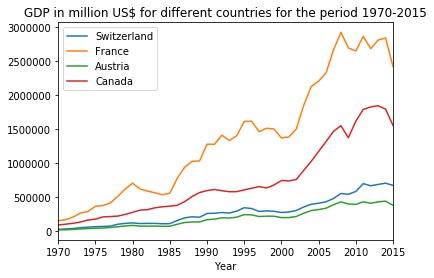

In [11]:
select_switzerland = df_useful["GDP"]['Area']=='Switzerland'
select_france = df_useful["GDP"]['Area']=='France'
select_austria = df_useful["GDP"]['Area']=='Austria'
select_canada = df_useful["GDP"]['Area']=='Canada'
ax = df_useful["GDP"][select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = df_useful["GDP"][select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful["GDP"][select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful["GDP"][select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('GDP in million US$ for different countries for the period 1970-2015')

For dissolute or new countries, we have some Nan values (before appearing or after dissolution) as in this next example :

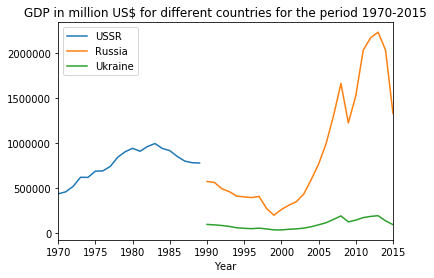

In [12]:
select_USSR = df_useful["GDP"]['Area']=='USSR'
select_russia = df_useful["GDP"]['Area']=='Russian Federation'
select_ukraine = df_useful["GDP"]['Area']=='Ukraine'
ax = df_useful["GDP"][select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = df_useful["GDP"][select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful["GDP"][select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('GDP in million US$ for different countries for the period 1970-2015')

##### 1.D.a.ii. Extracting crops harvested area, production, seed and yield from the "Crops production" dataset<a name="1Daii"></a>
We want to extract crops **harvested area**, **production**, **seed** and **yield** from the **"Crops production" dataset**. As all crops are not food crops, we request the [World crops database](https://world-crops.com/food-crops/) to **keep only the food crops**.

In [13]:
def get_food_crops():
    #Return a list of crops categorized as food crops https://world-crops.com/food-crops/
    url="https://world-crops.com/food-crops/"
    r=requests.get(url,headers={"User-Agent": "XY"})
    soup=BeautifulSoup(r.text,'html.parser')
    elements_temp=soup.find_all('a',href=re.compile("^../"))
    elements=[el.text for el in elements_temp]
    
    #only 40 elements are displayed on each page->iterating on the total list
    for i in range(40,401,40):
        url_i=url+"?ss="+str(i)
        r=requests.get(url_i,headers={"User-Agent":"XY"})
        soup=BeautifulSoup(r.text,'html.parser')
        new_elements=soup.find_all('a',href=re.compile("^../"))
        elements+=[el.text for el in new_elements]
    return elements

def inclusive_search(string,elements):
    #returns true if the string can be found in elements. The search removes special characters from string in order to include more positive results
    string=string.lower()
    delimiters = ",", "(","&",")"," and "," "
    pattern = '|'.join(map(re.escape, delimiters))
    strings=list(filter(None,re.split(pattern,string)))
    found=False
    for s in strings:
        if s=="nes":
            continue
        for el in elements:
            found=(s in el.split())
            if found==False and s[-1]=="s":
                found=s[:-1] in el.split()
            if found==False and s[-2:]=="es":
                found=s[:-2] in el.split()
            if found==False and s[-3:]=="ies":
                found=s[:-3]+"y" in el.split()
            if found==True:
                return found
    return found


def get_food_crop_data(df):    
    #extracts the food crop data, returns 4 df: Area,Production,Seed and yield    
    df=df.copy()
    food_crops=list(map(lambda x: x.lower(),get_food_crops()))              
    crop_types_df=df[['Item','Value']].groupby('Item').sum()
    crop_types_df=crop_types_df[list(map(lambda x : inclusive_search(x,food_crops) , crop_types_df.index ))]   
    food_crop_df=df[df.Item.apply(lambda x: x in crop_types_df.index)]
    return (food_crop_df[food_crop_df.Element=='Area harvested'],
            food_crop_df[food_crop_df.Element=='Production'],
            food_crop_df[food_crop_df.Element=='Seed'],
            food_crop_df[food_crop_df.Element=='Yield'])
  
food_crop_area_df , food_crop_production_df , food_crop_seed_df , food_crop_yield_df = get_food_crop_data(df["Crops production"])

In [14]:
df_useful['Crops Production'] = food_crop_production_df.drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])

We check everything is fine by looking at samples for each of the new dataframes:

In [15]:
display('Crops Production', df_useful['Crops Production'].sample(5))

'Crops Production'

,Area Code,Area,Item,Year,Unit,Value
1205979,156,New Zealand,"Melons, other (inc.cantaloupes)",2005,tonnes,1903.0
924431,112,Jordan,Oranges,1986,tonnes,18039.0
1826860,236,Venezuela (Bolivarian Republic of),Yams,1993,tonnes,40997.0
2586871,5817,Net Food Importing Developing Countries,"Pumpkins, squash and gourds",1986,tonnes,1492587.0
1536374,202,South Africa,Potatoes,2009,tonnes,1866580.0


We also make some plots to have a first understanding of the dataset:

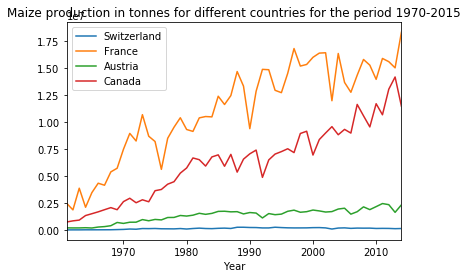

In [16]:
select_Maize = df_useful['Crops Production']['Item']=='Maize'
maize_df = df_useful['Crops Production'][select_Maize]

select_switzerland = maize_df['Area']=='Switzerland'
select_france = maize_df['Area']=='France'
select_austria = maize_df['Area']=='Austria'
select_canada = maize_df['Area']=='Canada'
ax = maize_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Maize production in tonnes for different countries for the period 1970-2015')

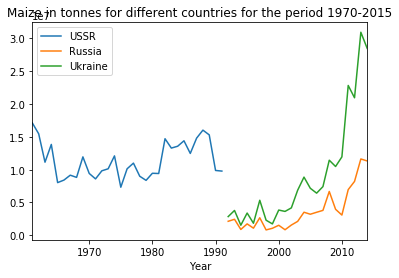

In [17]:
select_USSR = maize_df['Area']=='USSR'
select_russia = maize_df['Area']=='Russian Federation'
select_ukraine = maize_df['Area']=='Ukraine'
ax = maize_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Maize in tonnes for different countries for the period 1970-2015')

##### 1.D.a.iii. Extracting stocks production from the "Livestock production" dataset<a name="1Daiii"></a>

We want to extract **stocks production** from the **"Livestock production" dataset**. Again, we drop the columns that are useless for us and have a first look of the data with a sample and some plots.

In [18]:
selection_stocks = df['Livestock production']["Element"] == 'Stocks'
df_useful['Livestock production'] = df['Livestock production'][selection_stocks].drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])

In [19]:
display(df_useful['Livestock production'].sample(5))

,Area Code,Area,Item,Year,Unit,Value
122580,240,United States Virgin Islands,Asses,1999,Head,56.0
122703,240,United States Virgin Islands,Chickens,2014,1000 Head,42.0
54448,97,Hungary,Geese and guinea fowls,1993,1000 Head,894.0
34266,54,Denmark,Pigs,2008,Head,12737648.0
23640,351,China,Ducks,2009,1000 Head,750427.0


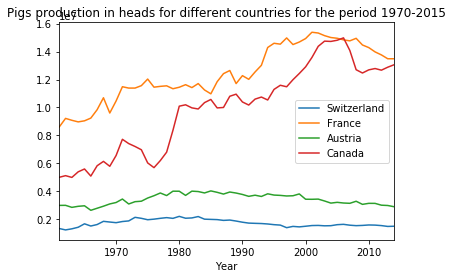

In [20]:
select_pigs = df_useful['Livestock production']['Item']=='Pigs'
pigs_df = df_useful['Livestock production'][select_pigs]

select_switzerland = pigs_df['Area']=='Switzerland'
select_france = pigs_df['Area']=='France'
select_austria = pigs_df['Area']=='Austria'
select_canada = pigs_df['Area']=='Canada'
ax = pigs_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Pigs production in heads for different countries for the period 1970-2015')

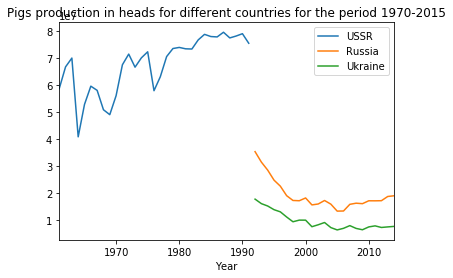

In [21]:
select_USSR = pigs_df['Area']=='USSR'
select_russia = pigs_df['Area']=='Russian Federation'
select_ukraine = pigs_df['Area']=='Ukraine'
ax = pigs_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Pigs production in heads for different countries for the period 1970-2015')

##### 1.D.a.iv. Extracting import and export quantities from the "Live animals trade" and "Crops trade" datasets<a name="1Daiv"></a>
Now, we extract **import and export quantities** from the **"Live animals trade" and "Crops trade" datasets**, having again some samples and some plots.

In [22]:
selection_import_quantities = df['Live animals trade']["Element"] == 'Import Quantity'
selection_export_quantities = df['Live animals trade']["Element"] == 'Export Quantity'

df_useful['Live animals import quantities'] = df['Live animals trade'][selection_import_quantities].drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])
df_useful['Live animals export quantities'] = df['Live animals trade'][selection_export_quantities].drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])

In [23]:
display(df_useful['Live animals import quantities'].sample(5))

,Area Code,Area,Item,Year,Unit,Value
508753,248,Yugoslav SFR,Sheep,1981,Head,125.0
61814,21,Brazil,Sheep,1978,Head,305.0
470620,223,Turkey,Horses,1965,Head,4.0
72612,233,Burkina Faso,Ducks,1964,1000 Head,NaN
330033,157,Nicaragua,Goats,2008,Head,1.0


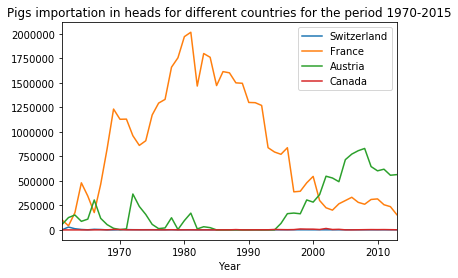

In [24]:
select_pigs = df_useful['Live animals import quantities']['Item']=='Pigs'
pigs_df = df_useful['Live animals import quantities'][select_pigs]

select_switzerland = pigs_df['Area']=='Switzerland'
select_france = pigs_df['Area']=='France'
select_austria = pigs_df['Area']=='Austria'
select_canada = pigs_df['Area']=='Canada'
ax = pigs_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Pigs importation in heads for different countries for the period 1970-2015')

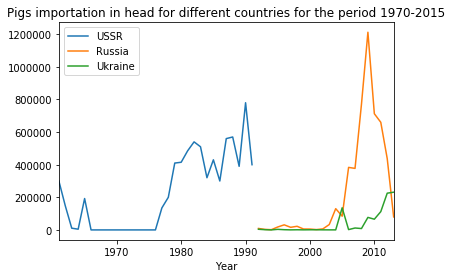

In [25]:
select_USSR = pigs_df['Area']=='USSR'
select_russia = pigs_df['Area']=='Russian Federation'
select_ukraine = pigs_df['Area']=='Ukraine'
ax = pigs_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Pigs importation in head for different countries for the period 1970-2015')

In [26]:
display(df_useful['Live animals export quantities'].sample(5))

,Area Code,Area,Item,Year,Unit,Value
575096,5207,South America,Pigs,1994,Head,33063.0
25205,11,Austria,Horses,2013,Head,1606.0
545218,5103,Northern Africa,Mules,2008,Head,0.0
281991,131,Malaysia,Ducks,1965,1000 Head,0.0
574217,5207,South America,Ducks,1963,1000 Head,0.0


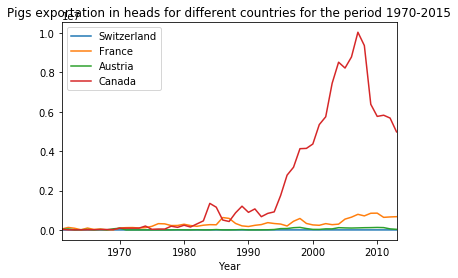

In [27]:
select_pigs = df_useful['Live animals export quantities']['Item']=='Pigs'
pigs_df = df_useful['Live animals export quantities'][select_pigs]

select_switzerland = pigs_df['Area']=='Switzerland'
select_france = pigs_df['Area']=='France'
select_austria = pigs_df['Area']=='Austria'
select_canada = pigs_df['Area']=='Canada'
ax = pigs_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Pigs exportation in heads for different countries for the period 1970-2015')

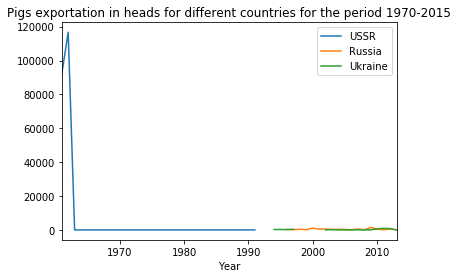

In [28]:
select_USSR = pigs_df['Area']=='USSR'
select_russia = pigs_df['Area']=='Russian Federation'
select_ukraine = pigs_df['Area']=='Ukraine'
ax = pigs_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Pigs exportation in heads for different countries for the period 1970-2015')

In [29]:
selection_import_quantities = df['Food trade']["Element"] == 'Import Quantity'
selection_export_quantities = df['Food trade']["Element"] == 'Export Quantity'

df_useful['Food import quantities'] = df['Food trade'][selection_import_quantities].drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])
df_useful['Food export quantities'] = df['Food trade'][selection_export_quantities].drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])

In [30]:
display(df_useful['Food import quantities'].sample(5))

,Area Code,Area,Item,Year,Unit,Value
10889600,215,United Republic of Tanzania,Bananas and plantains,1994,tonnes,NaN
6213951,130,Malawi,"Cake, palm kernel",1967,tonnes,0.0
1739722,35,Cabo Verde,Molasses,1994,tonnes,NaN
4766537,97,Hungary,"Feed, vegetable products nes",2006,tonnes,1582.0
4916847,100,India,Food wastes,2008,tonnes,0.0


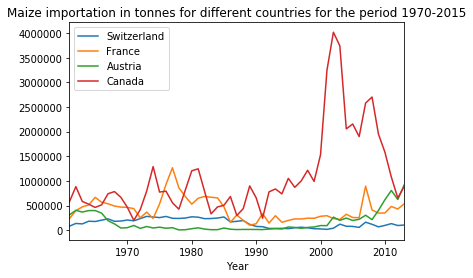

In [31]:
select_Maize = df_useful['Food import quantities']['Item']=='Maize'
maize_df = df_useful['Food import quantities'][select_Maize]

select_switzerland = maize_df['Area']=='Switzerland'
select_france = maize_df['Area']=='France'
select_austria = maize_df['Area']=='Austria'
select_canada = maize_df['Area']=='Canada'
ax = maize_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Maize importation in tonnes for different countries for the period 1970-2015')

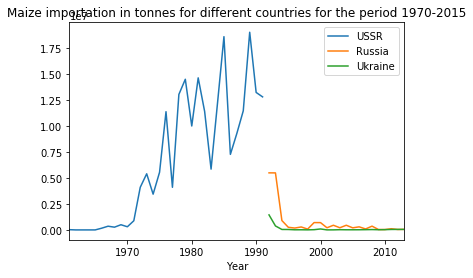

In [32]:
select_USSR = maize_df['Area']=='USSR'
select_russia = maize_df['Area']=='Russian Federation'
select_ukraine = maize_df['Area']=='Ukraine'
ax = maize_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Maize importation in tonnes for different countries for the period 1970-2015')

In [33]:
display(df_useful['Food export quantities'].sample(5))

,Area Code,Area,Item,Year,Unit,Value
14017277,5504,Polynesia,Wine,1965,tonnes,0.0
11156337,236,Venezuela (Bolivarian Republic of),"Cake, cottonseed",2005,tonnes,0.0
1743630,35,Cabo Verde,"Oil, sunflower",1980,tonnes,NaN
9351042,25,Solomon Islands,Sugar Raw Centrifugal,2013,tonnes,NaN
1551102,27,Bulgaria,Gooseberries,2001,tonnes,NaN


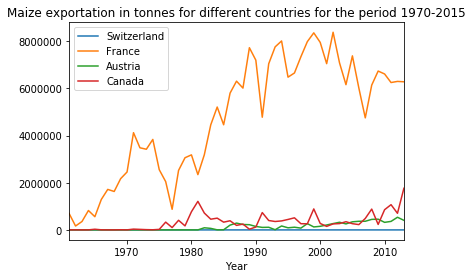

In [34]:
select_Maize = df_useful['Food export quantities']['Item']=='Maize'
maize_df = df_useful['Food export quantities'][select_Maize]

select_switzerland = maize_df['Area']=='Switzerland'
select_france = maize_df['Area']=='France'
select_austria = maize_df['Area']=='Austria'
select_canada = maize_df['Area']=='Canada'
ax = maize_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Maize exportation in tonnes for different countries for the period 1970-2015')

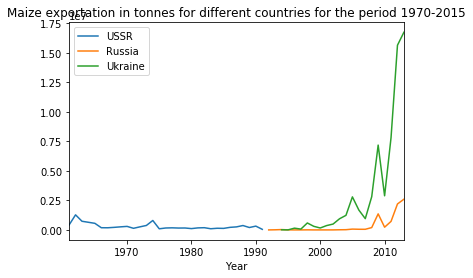

In [35]:
select_USSR = maize_df['Area']=='USSR'
select_russia = maize_df['Area']=='Russian Federation'
select_ukraine = maize_df['Area']=='Ukraine'
ax = maize_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Maize exportation in tonnes for different countries for the period 1970-2015')

##### 1.D.a.v. Extracting average CPI of each year from the "Consumer price indices" dataset<a name="1Dav"></a>

The **"Consumer price indices" dataset** contains **monthly data**. In order to have a **uniform dataframe**, and as other dataframes have **yearly data**, we will group it by (Country, Year) and compute the monthly mean for every year. Then we add a column to show the relative change in CPI, as this is what measures inflation, according to the following formula:

$$\frac{CPI_t - CPI_{t-1}}{CPI_{t-1}}$$

In [36]:
df_useful['Consumer price indices'] =  df['Consumer price indices'][['Area','Year','Value']] \
                                        .dropna() \
                                        .groupby(['Area',"Year"]) \
                                        .mean() \
                                        .reset_index() \
                                        .dropna()

In [37]:

#We calculate the relative change in CPI for each year relative to last years CPI - this indicates yearly inflation. The first year in each area is set to 0.


df_useful['Consumer price indices']['Value'] = np.where(df_useful['Consumer price indices']['Area'] == df_useful['Consumer price indices']['Area'].shift(1),
         ((df_useful['Consumer price indices']['Value'] - df_useful['Consumer price indices']['Value'].shift(1))/df_useful['Consumer price indices']['Value'].shift(1)) * 100, 0)




In [38]:
display(df_useful['Consumer price indices'].head(5))

,Area,Year,Value
0,Afghanistan,2004,0.000000
1,Afghanistan,2005,11.606340
2,Afghanistan,2006,7.254896
3,Afghanistan,2007,8.482889
4,Afghanistan,2008,30.554940


With samples and plots, we remark that this dataset **only starts in 2000** wheareas other ones start in 1970.

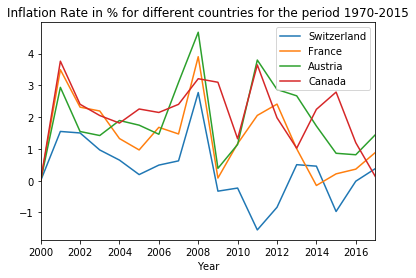

In [39]:
select_switzerland = df_useful['Consumer price indices']['Area']=='Switzerland'
select_france = df_useful['Consumer price indices']['Area']=='France'
select_austria = df_useful['Consumer price indices']['Area']=='Austria'
select_canada = df_useful['Consumer price indices']['Area']=='Canada'
ax = df_useful['Consumer price indices'][select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = df_useful['Consumer price indices'][select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful['Consumer price indices'][select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful['Consumer price indices'][select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Inflation Rate in % for different countries for the period 1970-2015')

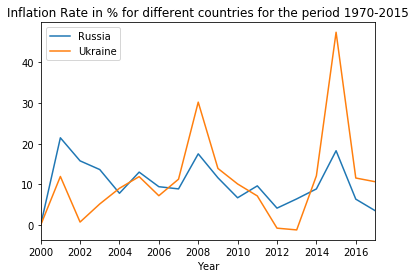

In [40]:
select_russia = df_useful["Consumer price indices"]['Area']=='Russian Federation'
select_ukraine = df_useful["Consumer price indices"]['Area']=='Ukraine'
ax = df_useful["Consumer price indices"][select_russia].plot(x ='Year', y='Value', kind = 'line')
ax = df_useful["Consumer price indices"][select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(['Russia', 'Ukraine'])
_ = ax.set_title('Inflation Rate in % for different countries for the period 1970-2015')

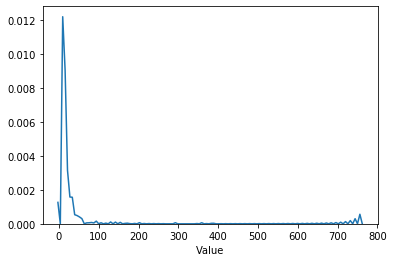

In [41]:
_ = sns.distplot(abs(df_useful["Consumer price indices"]["Value"]), rug=False, hist=False)

In [42]:
#looking at the cases where food prices increased over 100% during one year
df_useful["Consumer price indices"].loc[df_useful["Consumer price indices"]["Value"] > 100]

,Area,Year,Value
55,Angola,2001,152.561015
56,Angola,2002,108.897433
851,Democratic Republic of the Congo,2001,359.936605
1280,Guinea,2010,292.596028
2636,Sao Tome and Principe,2014,759.321212
2801,Solomon Islands,2012,203.559117
2833,South Sudan,2016,386.378414
2834,South Sudan,2017,130.056890
3283,Venezuela (Bolivarian Republic of),2015,171.224360
3284,Venezuela (Bolivarian Republic of),2016,142.586732


It seems that the formula calculating food price inflation is actually correct. These are realistic cases where the price increased by over 100% in the span of a year. 

##### 1.D.a.vi. Removing areas which are not countries <a name="1Davi"></a>

Having a more detailled look at the dataset, we have remarked that the **areas which are real countries** are exactely the ones with an "Area Code" below $5000$ but not in $[261, 269]$.

In [43]:
#remove Area code >= 5000 or in [261, 269] (EU)
for df_name in df_useful :
    if 'Area Code' in df_useful[df_name].keys() : 
        print ("Removing areas which are not countries in", df_name)
        selection_countries = df_useful[df_name]['Area Code']<261 
        selection_countries = selection_countries | (df_useful[df_name]['Area Code']>269)
        selection_countries = selection_countries & (df_useful[df_name]['Area Code']<5000)
        df_useful[df_name] = df_useful[df_name][selection_countries]
        display(df_useful[df_name].sample(5))
    else :
        print (df_name, "is already clean")

Removing areas which are not countries in GDP


,Area Code,Area,Year,Value
22261,22,Aruba,1992,958.463200
161159,63,Estonia,2008,24165.739525
247581,83,Kiribati,2004,102.370594
445444,276,Sudan,1984,NaN
56687,19,Bolivia (Plurinational State of),1992,5643.867693


Removing areas which are not countries in Crops Production


,Area Code,Area,Item,Year,Unit,Value
1486266,272,Serbia,Cucumbers and gherkins,2013,tonnes,63687.0
493371,116,Democratic People's Republic of Korea,"Roots and Tubers,Total",1998,tonnes,1692000.0
1375722,177,Puerto Rico,Lemons and limes,1966,tonnes,3220.0
1745766,225,United Arab Emirates,"Citrus Fruit,Total",1967,tonnes,2300.0
805924,100,India,Soybeans,1970,tonnes,14000.0


Removing areas which are not countries in Livestock production


,Area Code,Area,Item,Year,Unit,Value
81125,150,Netherlands,Goats,1972,Head,20000.0
4900,1,Armenia,Turkeys,1994,1000 Head,300.0
46330,79,Germany,Sheep and Goats,1963,Head,3395900.0
59128,104,Ireland,Cattle and Buffaloes,1983,Head,5795200.0
88062,165,Pakistan,Sheep,2011,Head,28086000.0


Removing areas which are not countries in Live animals import quantities


,Area Code,Area,Item,Year,Unit,Value
325966,156,New Zealand,Buffaloes,1969,Head,NaN
300546,141,Mongolia,Cattle,1970,Head,NaN
162918,238,Ethiopia,Chickens,1997,1000 Head,0.0
187232,79,Germany,Sheep and Goats,1983,Head,338024.0
330730,157,Nicaragua,Sheep,1963,Head,0.0


Removing areas which are not countries in Live animals export quantities


,Area Code,Area,Item,Year,Unit,Value
317572,150,Netherlands,"Pigeons, other birds",1986,1000 Head,630.0
222959,101,Indonesia,Goats,1988,Head,0.0
126914,98,Croatia,Goats,2010,Head,0.0
456815,154,The former Yugoslav Republic of Macedonia,Rabbits and hares,2013,1000 Head,0.0
191787,84,Greece,Ducks,1980,1000 Head,NaN


Removing areas which are not countries in Food import quantities


,Area Code,Area,Item,Year,Unit,Value
596533,52,Azerbaijan,"Oil, boiled etc",2007,tonnes,14.0
390093,22,Aruba,"Oil, boiled etc",2003,tonnes,NaN
758910,16,Bangladesh,"Fructose and syrup, other",1980,tonnes,0.0
937579,15,Belgium-Luxembourg,"Cake, palm kernel",1993,tonnes,50140.0
4497461,89,Guatemala,Waxes vegetable,2011,tonnes,98.0


Removing areas which are not countries in Food export quantities


,Area Code,Area,Item,Year,Unit,Value
10713753,225,United Arab Emirates,Pistachios,2001,tonnes,NaN
7608255,162,Norway,"Vegetables, preserved, frozen",1977,tonnes,NaN
498265,11,Austria,"Anise, badian, fennel, coriander",2002,tonnes,832.0
2335248,128,"China, Macao SAR",Sweet corn prep or preserved,2012,tonnes,0.0
6604830,137,Mauritius,Olives,1971,tonnes,NaN


Consumer price indices is already clean


#### 1.D.b. Handling of the missing data  <a name="1Db"></a>

In this section, we will explain how we will handle the missing data in previous dataframes for maps.

##### 1.D.b.i. Highlighting the problem  <a name="1Dbi"></a> 

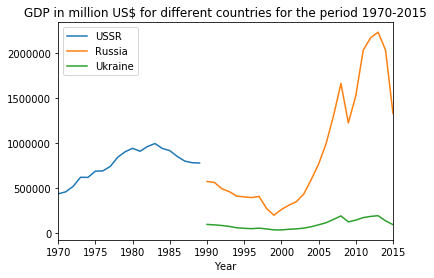

In [44]:
select_USSR = df_useful["GDP"]['Area']=='USSR'
select_russia = df_useful["GDP"]['Area']=='Russian Federation'
select_ukraine = df_useful["GDP"]['Area']=='Ukraine'
ax = df_useful["GDP"][select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = df_useful["GDP"][select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful["GDP"][select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('GDP in million US$ for different countries for the period 1970-2015')

In order to **vizualize folium maps**, we need to **associate each country a value**. The geojson file that we use is not timestamped and **only countries that exist nowadays** are inside it. As **some countries has been dissolved** during the past 50 years, our folium maps won't be complete. For instance, we do not have any value for Ukraine from 1970 to 1989. Our idea to fix this issue is presented in the next paragraph.

##### 1.D.b.ii. Proposed correction  <a name="1Dbii"></a> 


Our idea is to **map the former country value to each of the current ones**. For instance in 1982, USSR GDP is around one trillion \\$. Therefore, if we associate (**only for folium map purposes**) this value to each current country that succeeded USSR, **all these countries will appear the same color** in the folium map, i.e. all the USSR area will appear the same color (and the good one).

In order to do so, one need to **identify which countries appeared and disappeared** from the dataset and **at which year**. Then we will use this result along with some **historical research** in our `visualise_world_data_folium` function ([1.E.a.](#1Ea)).

In [45]:
countries_formation_years = {}
for country in df_useful["GDP"]["Area"].unique():
    selection = df_useful["GDP"]["Area"] == country
    year_in, year_out = df_useful["GDP"][selection].dropna()["Year"].min(), df_useful["GDP"][selection].dropna()["Year"].max()
    for year in (year_in, year_out):
        if year not in countries_formation_years :
            countries_formation_years[year] = []
    countries_formation_years[year_in].append((country,'+'))
    countries_formation_years[year_out].append((country,'-'))

countries_formation_years.pop(1970)
countries_formation_years.pop(2015)
for year in sorted(list(countries_formation_years)):
    print (year, countries_formation_years[year])

1988 [('Yemen Ar Rp', '-'), ('Yemen Dem', '-')]
1989 [('Czechoslovakia', '-'), ('Ethiopia PDR', '-'), ('USSR', '-'), ('Yemen', '+'), ('Yugoslav SFR', '-')]
1990 [('Armenia', '+'), ('Azerbaijan', '+'), ('Belarus', '+'), ('Bosnia and Herzegovina', '+'), ('Croatia', '+'), ('Czechia', '+'), ('Eritrea', '+'), ('Estonia', '+'), ('Ethiopia', '+'), ('Georgia', '+'), ('Kazakhstan', '+'), ('Kyrgyzstan', '+'), ('Latvia', '+'), ('Lithuania', '+'), ('Montenegro', '+'), ('Republic of Moldova', '+'), ('Russian Federation', '+'), ('Serbia', '+'), ('Slovakia', '+'), ('Slovenia', '+'), ('Tajikistan', '+'), ('The former Yugoslav Republic of Macedonia', '+'), ('Timor-Leste', '+'), ('Turkmenistan', '+'), ('Ukraine', '+'), ('Uzbekistan', '+')]
1999 [('Kosovo', '+')]
2005 [('Curaçao', '+'), ('Sint Maarten (Dutch Part)', '+')]
2007 [('Sudan (former)', '-')]
2008 [('South Sudan', '+'), ('Sudan', '+')]
2012 [('Netherlands Antilles (former)', '-')]


### 1.E. Preprocessing the data set  <a name="1E"></a>

In this part, we will finish prepocessing the datasets. More precisely, we will deal with **country names** and **normalizing** the features.

1.  
    5. 
    
        1. [Converting country names between different naming conventions](#1Ea)
        
        2. [Normalization and log scales](#1Eb)

#### 1.E.a. Converting country names between different naming conventions  <a name="1Ea"></a>
Some countries have **different names in the geojson file and in the dataset**. We first start by correcting them.

In [46]:
# Useful method for name correction
def correct_country_names(old_name, dic):
    if old_name in dic.keys() :
        return dic[old_name]
    return old_name

In [47]:
# Declaring dictionary with name correction
dic = {'Czechia': "Czech Republic",
       'Russian Federation':'Russia',
       "Serbia":"Republic of Serbia",
       'The former Yugoslav Republic of Macedonia':'Macedonia',
       'China, mainland':'China',
       'Viet Nam':'Vietnam',
       'Venezuela (Bolivarian Republic of)':'Venezuela',
       'Iran (Islamic Republic of)':'Iran',
       'Syrian Arab Republic':"Syria",
       'Bolivia (Plurinational State of)': 'Bolivia',
       "Côte d'Ivoire": "Ivory Coast",
       'Congo':"Republic of the Congo",
       "Lao People's Democratic Republic":'Laos',
       "Democratic People's Republic of Korea":"North Korea",
       'Republic of Korea':"South Korea",
       'USSR':['Armenia',
               'Azerbaijan',
               'Belarus',
               'Estonia',
               'Georgia',
               'Kazakhstan',
               'Kyrgyzstan',
               'Latvia',
               'Lithuania',
               'Montenegro',
               'Republic of Moldova',
               'Russia',
               'Republic of Serbia',
               'Timor-Leste',
               'Turkmenistan',
               'Ukraine',
               'Uzbekistan'],
       'Ethiopia PDR':['Eritrea','Ethiopia'],
       'Yugoslav SFR':['Kosovo', 'Slovenia', 'Croatia','Macedonia', 'Bosnia and Herzegovina'],
       'Yemen Dem':['Yemen'],
       'Czechoslovakia':["Czech Republic", 'Slovakia'],
       'Netherlands Antilles (former)':['Curaçao', 'Sint Maarten (Dutch Part)'],
       'Sudan (former)':['South Sudan', 'Sudan']}

# Correcting each DataFrame
for df_name in df_useful :
    print (df_name)
    df_useful[df_name]["Area"] = df_useful[df_name]["Area"].apply(lambda x : correct_country_names(x,dic))
    df_useful[df_name]=df_useful[df_name].explode('Area')

GDP
Crops Production
Livestock production
Live animals import quantities
Live animals export quantities
Food import quantities
Food export quantities
Consumer price indices


Then, we do a function that takes as input **a dataframe and a year** and produces the **corresponding folium map**. This function also h**andles dissolutions of countries** as suggested [before](#1Dbii).

In [48]:
import matplotlib.colors as colors

def visualise_world_data_folium(df, to_visualise, year, log=True,log2=False):
    
    if log2:
        log=False
    if log:
        log2=False
        
    # Defining color palette
    color_scale = sns.cubehelix_palette(9)
    
    # importing geojson and transforming to pandas
    geo_data=json.load(open("Scripts/Data/world-countries.json"))
    dics=geo_data['features']
    clean_dics=[]
    for country in dics:
        clean_dics.append({'Country':country['properties']['name'],
                          'geometry':country['geometry']})
    geo_df=pd.DataFrame(clean_dics)
    
    # cropping to df to data of interest
    df_visu=df[df.Year==year][['Area',to_visualise]]

    # Merging with geo data
    df_visu=geo_df.merge(df_visu,how='left',left_on='Country',right_on='Area')
    df_visu=df_visu.dropna()
    
    if log:
        df_visu['to_plot']=df_visu[to_visualise].apply(lambda x : np.log10(x))
        
    def log2_scale(x):
        out=np.sign(x)*np.log10(1+np.abs(x))
        return out
        
    if log2:
        df_visu['to_plot']=df_visu[to_visualise].apply(log2_scale)
    
    # creating bins for color scaling
    ma_value=df_visu['to_plot'].max()
    mi_value=df_visu['to_plot'].min()
    bins=np.linspace(mi_value,ma_value,8)
    
    # creating Json string for folium
    features=[]
    for _,row in df_visu.iterrows():
        color=np.digitize(row['to_plot'],bins)
        val=row[to_visualise]
        feature={
            'type' : 'Feature',
            
            'properties':{'name':row['Country'],
                          'value': '{:.2E}'.format(val),
                          'color':colors.to_hex(color_scale[color])},
            'geometry':row['geometry']
            }
        features.append(feature)
    
    def style(feature):
        
        if feature['properties']['value']==np.nan:
            print("lol")
            opac=0
        else:
            opac=0.8
        return {'fillOpacity':opac,
                   'weight':0.1,
                   'fillColor':feature['properties']['color']}
    geo_data=folium.GeoJson({'type':'FeatureCollection','features':features},style_function=style,tooltip=folium.features.GeoJsonTooltip(['name','value']))
    m=folium.Map()
    geo_data.add_to(m)
    return m

We can know use it to produce some maps. For instance, we plot below the map of GDP for the year 1985 (before dissolution of USSR) and 1995 (after).

In [50]:
display(visualise_world_data_folium(df_useful["GDP"], 'Value', 1985, True))
display(visualise_world_data_folium(df_useful["GDP"], 'Value', 1995, True))

#### 1.E.b. Normalization and log scales  <a name="1Eb"></a>

Some of our features **seem to be right skewed**. At first glance it seems that they look like power laws.

For instance the distribution of GDP look a bit like a power law:

C:\Users\Martin\.conda\envs\ada\lib\site-packages\statsmodels\nonparametric\kde.py:447: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
C:\Users\Martin\.conda\envs\ada\lib\site-packages\statsmodels\nonparametric\kde.py:447: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


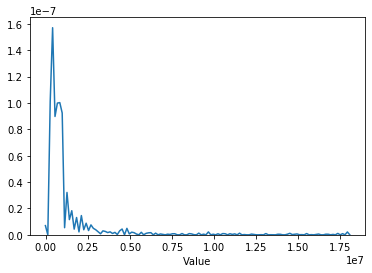

In [51]:
_ = sns.distplot(df_useful["GDP"]["Value"], rug=False, hist=False)

As we later want to train some Machine Learning models, we log those values so that their distribution look a bit **more like a normal distribution**.

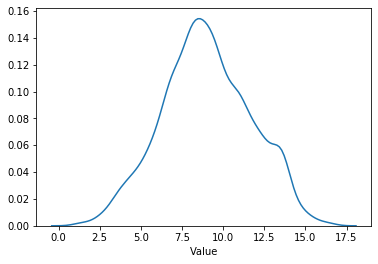

In [52]:
#looks better with log scale
_ = sns.distplot(np.log(df_useful["GDP"]["Value"]), rug=False, hist=False)

The new distribution indeed looks better to train models on it.

### 1.F. Making one uniformized dataframe  <a name="1F"></a>

In this part, we will make one **uniformized dataframe** `uni_df` with the following columns.


    Country | Year | GDP | Crops production columns | Livestock production columns | Crops importation columns | Livestock importation columns | Crops exportation columns | Livestock exportation columns | CPI
    
In this uniformized dataframe, **a tuple `(Country, Year)` uniquely identifies a row**.


#### 1.F.a. Pivoting dataframes with items  <a name="1Fa"></a>

The current dataframes have several rows for a given `(Country, Year)`. Each of this row correspond to one item. We would like to have a unique row for a given `(Country, Year)` and one column per item:

In [53]:
need_pivot = ['Crops Production',
              'Livestock production',
              'Live animals import quantities',
              'Live animals export quantities',
              'Food import quantities',
              'Food export quantities']

def rename_columns(x, word):
    if x not in ['Area', 'Year', 'ha', 'tonnes', 'hg/ha', 'Head', '1000 Head']:
        return x + ' ' + word
    return x

df_useful['GDP'] = df_useful['GDP'].rename(columns = {'Value':'(GDP, million $)'})[["Area",'Year','(GDP, million $)']]
df_useful['Consumer price indices'] = df_useful['Consumer price indices'].rename(columns = {'Value':'(Consumer price indices, %)'})[["Area",'Year','(Consumer price indices, %)']]

for df_name in need_pivot :
    df_useful[df_name] = pd.pivot_table(df_useful[df_name], index=["Area",'Year'], columns=["Item","Unit"], values="Value").rename(columns=lambda x: rename_columns(x, df_name))
    display(df_name, df_useful[df_name].sample(5))

'Crops Production'

,Item,"Anise, badian, fennel, coriander Crops Production",Apples Crops Production,Apricots Crops Production,Areca nuts Crops Production,Artichokes Crops Production,Asparagus Crops Production,Avocados Crops Production,Bambara beans Crops Production,Bananas Crops Production,Barley Crops Production,...,Sweet potatoes Crops Production,"Tangerines, mandarins, clementines, satsumas Crops Production",Taro (cocoyam) Crops Production,Tomatoes Crops Production,Tung nuts Crops Production,"Vegetables&Melons, Total Crops Production",Vetches Crops Production,Watermelons Crops Production,Wheat Crops Production,Yams Crops Production
,Unit,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,...,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes
Area,Year,,,,,,,,,,,,,,,,,,,,,
Bhutan,1961,NaN,2000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2200.0,...,NaN,NaN,NaN,NaN,NaN,8000.0,NaN,NaN,5000.0,NaN
Yemen,2004,NaN,10833.0,1177.0,NaN,NaN,NaN,NaN,NaN,85555.0,24791.0,...,325.0,11718.0,NaN,200438.0,NaN,648784.0,NaN,141339.0,103265.0,NaN
Belize,1961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1500.0,NaN,...,NaN,NaN,NaN,NaN,NaN,1100.0,NaN,NaN,NaN,NaN
Sierra Leone,2009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,176969.0,NaN,2750.0,25000.0,NaN,290000.0,NaN,NaN,NaN,NaN
Chile,2007,NaN,1400000.0,18000.0,NaN,38000.0,11000.0,209645.0,NaN,NaN,87895.0,...,9500.0,25200.0,NaN,903000.0,NaN,2186000.0,NaN,47000.0,1095872.0,NaN


'Livestock production'

,Item,Animals live nes Livestock production,Asses Livestock production,Beehives Livestock production,Buffaloes Livestock production,"Camelids, other Livestock production",Camels Livestock production,Cattle Livestock production,Cattle and Buffaloes Livestock production,Chickens Livestock production,Ducks Livestock production,...,Horses Livestock production,Mules Livestock production,"Pigeons, other birds Livestock production",Pigs Livestock production,Poultry Birds Livestock production,Rabbits and hares Livestock production,"Rodents, other Livestock production",Sheep Livestock production,Sheep and Goats Livestock production,Turkeys Livestock production
,Unit,Head,Head,No Livestock production,Head,Head,Head,Head,Head,1000 Head,1000 Head,...,Head,Head,1000 Head,Head,1000 Head,1000 Head,1000 Head,Head,Head,1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,,
Trinidad and Tobago,1990,NaN,2000.0,6200.0,7500.0,NaN,NaN,41000.0,48500.0,12500.0,NaN,...,1000.0,1700.0,NaN,40000.0,12500.0,NaN,NaN,6000.0,63250.0,NaN
Thailand,1995,NaN,30.0,NaN,4181612.0,NaN,NaN,6667631.0,10849243.0,172370.0,18897.0,...,16875.0,25.0,NaN,5369100.0,191680.0,NaN,NaN,75329.0,207729.0,NaN
Vanuatu,1968,NaN,NaN,NaN,NaN,NaN,NaN,68900.0,68900.0,150.0,NaN,...,1243.0,NaN,NaN,56000.0,150.0,NaN,NaN,NaN,9150.0,NaN
Uzbekistan,2012,NaN,342100.0,238600.0,NaN,NaN,18500.0,9642500.0,9642500.0,41880.0,NaN,...,195200.0,NaN,NaN,96800.0,42730.0,158900.0,NaN,13405900.0,16189000.0,850.0
Romania,2009,NaN,30000.0,998000.0,NaN,NaN,NaN,2684000.0,2684000.0,84373.0,4000.0,...,820000.0,NaN,NaN,6174000.0,93873.0,1600.0,NaN,8882000.0,9780000.0,1000.0


'Live animals import quantities'

,Item,Animals live nes Live animals import quantities,Asses Live animals import quantities,Beehives Live animals import quantities,"Bovine, Animals Live animals import quantities",Buffaloes Live animals import quantities,"Camelids, other Live animals import quantities",Camels Live animals import quantities,Cattle Live animals import quantities,Chickens Live animals import quantities,Ducks Live animals import quantities,Goats Live animals import quantities,Horses Live animals import quantities,Mules Live animals import quantities,"Pigeons, other birds Live animals import quantities",Pigs Live animals import quantities,Rabbits and hares Live animals import quantities,"Rodents, other Live animals import quantities",Sheep Live animals import quantities,Sheep and Goats Live animals import quantities,Turkeys Live animals import quantities
,Unit,Head,Head,No Live animals import quantities,Head,Head,Head,Head,Head,1000 Head,1000 Head,Head,Head,Head,1000 Head,Head,1000 Head,1000 Head,Head,Head,1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Bosnia and Herzegovina,1989,NaN,NaN,NaN,74022.0,NaN,NaN,NaN,74022.0,985.0,0.0,0.0,170.0,NaN,0.0,483667.0,NaN,NaN,18423.0,18423.0,0.0
Republic of the Congo,1985,NaN,NaN,NaN,5000.0,NaN,NaN,NaN,5000.0,1900.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,3107.0,3107.0,NaN
New Zealand,1967,0.0,0.0,NaN,8.0,NaN,NaN,NaN,8.0,1.0,NaN,0.0,125.0,NaN,NaN,1.0,NaN,NaN,335.0,335.0,NaN
Bangladesh,2011,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,2058.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Mali,1975,NaN,0.0,NaN,0.0,NaN,NaN,NaN,0.0,10.0,NaN,0.0,0.0,NaN,NaN,0.0,NaN,NaN,0.0,0.0,NaN


'Live animals export quantities'

,Item,Animals live nes Live animals export quantities,Asses Live animals export quantities,Beehives Live animals export quantities,"Bovine, Animals Live animals export quantities",Buffaloes Live animals export quantities,"Camelids, other Live animals export quantities",Camels Live animals export quantities,Cattle Live animals export quantities,Chickens Live animals export quantities,Ducks Live animals export quantities,Goats Live animals export quantities,Horses Live animals export quantities,Mules Live animals export quantities,"Pigeons, other birds Live animals export quantities",Pigs Live animals export quantities,Rabbits and hares Live animals export quantities,"Rodents, other Live animals export quantities",Sheep Live animals export quantities,Sheep and Goats Live animals export quantities,Turkeys Live animals export quantities
,Unit,Head,Head,No Live animals export quantities,Head,Head,Head,Head,Head,1000 Head,1000 Head,Head,Head,Head,1000 Head,Head,1000 Head,1000 Head,Head,Head,1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Cambodia,2008,NaN,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
Romania,1987,NaN,NaN,NaN,133900.0,NaN,NaN,NaN,133900.0,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,268800.0,268800.0,0.0
France,1975,NaN,31.0,NaN,1354025.0,NaN,NaN,NaN,1354025.0,11475.0,7.0,3001.0,2196.0,42.0,13.0,181739.0,6.0,NaN,1984.0,4985.0,35.0
Bosnia and Herzegovina,1972,NaN,5244.0,NaN,170812.0,345.0,NaN,NaN,170467.0,450.0,NaN,0.0,156415.0,247.0,33.0,5398.0,NaN,NaN,66604.0,66604.0,270.0
Sweden,1968,NaN,1.0,NaN,469.0,2.0,NaN,NaN,467.0,43.0,NaN,18.0,171.0,NaN,NaN,268.0,NaN,NaN,59.0,77.0,0.0


'Food import quantities'

,Item,Alfalfa meal and pellets Food import quantities,Almonds shelled Food import quantities,Animal Oil+Fat+Grs Food import quantities,Animal Vegetable Oil Food import quantities,Animal fats Food import quantities,"Anise, badian, fennel, coriander Food import quantities",Apples Food import quantities,Apricots Food import quantities,"Apricots, dry Food import quantities",Artichokes Food import quantities,...,"Wheat+Flour,Wheat Equivalent Food import quantities","Whey, Pres+Concen Food import quantities","Whey, condensed Food import quantities","Whey, dry Food import quantities",Wine Food import quantities,Wine+Vermouth+Sim. Food import quantities,"Wool, degreased Food import quantities","Wool, greasy Food import quantities","Wool, hair waste Food import quantities","Yoghurt, concentrated or not Food import quantities"
,Unit,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,...,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes
Area,Year,,,,,,,,,,,,,,,,,,,,,
Spain,1986,0.0,1118.0,181537.0,297561.0,181537.0,399.0,10825.0,0.0,337.0,0.0,...,883738.0,21786.0,4492.0,17294.0,4106.0,4162.0,4391.0,16454.0,622.0,0.0
Central African Republic,1988,0.0,NaN,0.0,733.0,0.0,NaN,33.0,NaN,NaN,NaN,...,30145.0,NaN,NaN,NaN,2298.0,2305.0,NaN,NaN,NaN,0.0
Bolivia,1985,NaN,NaN,467.0,13471.0,467.0,0.0,1460.0,NaN,NaN,NaN,...,375791.0,NaN,NaN,NaN,76.0,76.0,0.0,0.0,112.0,0.0
Argentina,1981,0.0,1097.0,232.0,7879.0,232.0,159.0,1704.0,0.0,0.0,0.0,...,0.0,634.0,NaN,634.0,626.0,697.0,0.0,40.0,0.0,0.0
Sao Tome and Principe,1989,NaN,NaN,NaN,1100.0,NaN,0.0,0.0,NaN,NaN,NaN,...,12739.0,NaN,NaN,NaN,850.0,850.0,NaN,NaN,NaN,NaN


'Food export quantities'

,Item,Alfalfa meal and pellets Food export quantities,Almonds shelled Food export quantities,Animal Oil+Fat+Grs Food export quantities,Animal Vegetable Oil Food export quantities,Animal fats Food export quantities,"Anise, badian, fennel, coriander Food export quantities",Apples Food export quantities,Apricots Food export quantities,"Apricots, dry Food export quantities",Artichokes Food export quantities,...,"Wheat+Flour,Wheat Equivalent Food export quantities","Whey, Pres+Concen Food export quantities","Whey, condensed Food export quantities","Whey, dry Food export quantities",Wine Food export quantities,Wine+Vermouth+Sim. Food export quantities,"Wool, degreased Food export quantities","Wool, greasy Food export quantities","Wool, hair waste Food export quantities","Yoghurt, concentrated or not Food export quantities"
,Unit,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,...,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes
Area,Year,,,,,,,,,,,,,,,,,,,,,
Namibia,2004,0.0,NaN,30.0,3134.0,30.0,1.0,1500.0,74.0,NaN,0.0,...,32.0,0.0,NaN,0.0,86.0,87.0,1.0,0.0,NaN,0.0
Myanmar,1994,NaN,NaN,0.0,0.0,0.0,1200.0,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
Occupied Palestinian Territory,1980,NaN,NaN,NaN,6527.0,NaN,NaN,NaN,23.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Benin,2012,NaN,0.0,1.0,18532.0,1.0,NaN,NaN,NaN,0.0,NaN,...,16464.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0
Panama,2007,NaN,NaN,248.0,2922.0,248.0,0.0,0.0,NaN,NaN,NaN,...,28.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,0.0


Some **Nan values** have appeared. After some analysis, we have conclude to replace those Nan values by zeros. Indeed, it seems that those Nan values means that the value were very low and not significant to be measured.

In [54]:
# Deal with the NaN that appeared
for df_name in df_useful :
    if df_name != "GDP":
        for column in list(df_useful[df_name]):
            if column not in ['Area', 'Year']:
                df_useful[df_name][column].fillna(0, inplace=True)

In [55]:
#removing the multiindex, so that merge is clean with GDP and CPI
for df_name in need_pivot :
    df_useful[df_name].columns = [' '.join([str(_) for _ in v]) for v in df_useful[df_name].columns.values]
    display(df_useful[df_name].sample(5))
    

,,"Anise, badian, fennel, coriander Crops Production tonnes",Apples Crops Production tonnes,Apricots Crops Production tonnes,Areca nuts Crops Production tonnes,Artichokes Crops Production tonnes,Asparagus Crops Production tonnes,Avocados Crops Production tonnes,Bambara beans Crops Production tonnes,Bananas Crops Production tonnes,Barley Crops Production tonnes,...,Sweet potatoes Crops Production tonnes,"Tangerines, mandarins, clementines, satsumas Crops Production tonnes",Taro (cocoyam) Crops Production tonnes,Tomatoes Crops Production tonnes,Tung nuts Crops Production tonnes,"Vegetables&Melons, Total Crops Production tonnes",Vetches Crops Production tonnes,Watermelons Crops Production tonnes,Wheat Crops Production tonnes,Yams Crops Production tonnes
Area,Year,,,,,,,,,,,,,,,,,,,,,
Saint Vincent and the Grenadines,1981,0.0,300.0,0.0,0.0,0.0,0.0,0.0,0.0,33220.0,0.0,...,1369.0,0.0,0.0,0.0,0.0,1841.0,0.0,0.0,0.0,4320.0
Senegal,1995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8500.0,0.0,...,3786.0,0.0,0.0,31360.0,0.0,310580.0,0.0,232960.0,0.0,0.0
Ivory Coast,1976,0.0,0.0,0.0,0.0,0.0,0.0,6600.0,0.0,147190.0,0.0,...,22000.0,0.0,191839.0,12600.0,0.0,250100.0,0.0,0.0,0.0,2032000.0
Switzerland,1969,0.0,530000.0,12000.0,0.0,0.0,0.0,0.0,0.0,0.0,132300.0,...,0.0,0.0,0.0,22300.0,0.0,259945.0,0.0,0.0,378900.0,0.0
Samoa,2009,0.0,0.0,0.0,0.0,0.0,0.0,1160.0,0.0,25000.0,0.0,...,0.0,0.0,20248.0,0.0,0.0,1185.0,0.0,0.0,0.0,2953.0


,,Animals live nes Livestock production Head,Asses Livestock production Head,Beehives Livestock production No Livestock production,Buffaloes Livestock production Head,"Camelids, other Livestock production Head",Camels Livestock production Head,Cattle Livestock production Head,Cattle and Buffaloes Livestock production Head,Chickens Livestock production 1000 Head,Ducks Livestock production 1000 Head,...,Horses Livestock production Head,Mules Livestock production Head,"Pigeons, other birds Livestock production 1000 Head",Pigs Livestock production Head,Poultry Birds Livestock production 1000 Head,Rabbits and hares Livestock production 1000 Head,"Rodents, other Livestock production 1000 Head",Sheep Livestock production Head,Sheep and Goats Livestock production Head,Turkeys Livestock production 1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,,
Italy,1993,0.0,38945.0,1200000.0,103200.0,0.0,0.0,7600300.0,7703500.0,127628.0,0.0,...,315838.0,18098.0,0.0,8244000.0,149828.0,64000.0,0.0,10344000.0,11688000.0,22200.0
Chad,1968,0.0,300000.0,112000.0,0.0,0.0,355000.0,4630000.0,4630000.0,2700.0,0.0,...,150000.0,0.0,0.0,5000.0,2700.0,0.0,0.0,2075000.0,4150000.0,0.0
Swaziland,2000,0.0,14800.0,0.0,0.0,0.0,0.0,588288.0,588288.0,3000.0,0.0,...,1400.0,90.0,0.0,29951.0,3000.0,0.0,0.0,27000.0,448800.0,0.0
Greece,1974,0.0,311561.0,1003000.0,7272.0,0.0,0.0,1231732.0,1239004.0,29566.0,180.0,...,180000.0,154572.0,1307.0,825702.0,31265.0,2030.0,0.0,8367031.0,12838738.0,158.0
Algeria,1976,0.0,463260.0,182000.0,0.0,0.0,140760.0,1014720.0,1014720.0,16561.0,24.0,...,139130.0,188590.0,0.0,4100.0,16625.0,1160.0,0.0,9336600.0,11478960.0,27.0


,,Animals live nes Live animals import quantities Head,Asses Live animals import quantities Head,Beehives Live animals import quantities No Live animals import quantities,"Bovine, Animals Live animals import quantities Head",Buffaloes Live animals import quantities Head,"Camelids, other Live animals import quantities Head",Camels Live animals import quantities Head,Cattle Live animals import quantities Head,Chickens Live animals import quantities 1000 Head,Ducks Live animals import quantities 1000 Head,Goats Live animals import quantities Head,Horses Live animals import quantities Head,Mules Live animals import quantities Head,"Pigeons, other birds Live animals import quantities 1000 Head",Pigs Live animals import quantities Head,Rabbits and hares Live animals import quantities 1000 Head,"Rodents, other Live animals import quantities 1000 Head",Sheep Live animals import quantities Head,Sheep and Goats Live animals import quantities Head,Turkeys Live animals import quantities 1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Uruguay,1995,0.0,0.0,0.0,13.0,0.0,0.0,0.0,13.0,7.0,0.0,0.0,185.0,0.0,0.0,430.0,0.0,0.0,10.0,10.0,0.0
American Samoa,1966,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Peru,1963,0.0,0.0,0.0,131258.0,0.0,0.0,0.0,131258.0,183.0,0.0,0.0,130.0,0.0,0.0,0.0,0.0,0.0,1504.0,1504.0,0.0
Central African Republic,1990,0.0,0.0,0.0,49592.0,0.0,0.0,0.0,49592.0,0.0,0.0,2807.0,0.0,0.0,0.0,0.0,0.0,0.0,5528.0,8335.0,0.0
Eritrea,2012,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,,Animals live nes Live animals export quantities Head,Asses Live animals export quantities Head,Beehives Live animals export quantities No Live animals export quantities,"Bovine, Animals Live animals export quantities Head",Buffaloes Live animals export quantities Head,"Camelids, other Live animals export quantities Head",Camels Live animals export quantities Head,Cattle Live animals export quantities Head,Chickens Live animals export quantities 1000 Head,Ducks Live animals export quantities 1000 Head,Goats Live animals export quantities Head,Horses Live animals export quantities Head,Mules Live animals export quantities Head,"Pigeons, other birds Live animals export quantities 1000 Head",Pigs Live animals export quantities Head,Rabbits and hares Live animals export quantities 1000 Head,"Rodents, other Live animals export quantities 1000 Head",Sheep Live animals export quantities Head,Sheep and Goats Live animals export quantities Head,Turkeys Live animals export quantities 1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Kyrgyzstan,1962,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19180.0,0.0,0.0,116700.0,0.0,0.0,0.0,0.0,0.0
Laos,2010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Eritrea,1992,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Saudi Arabia,1995,0.0,0.0,0.0,28.0,0.0,0.0,1000.0,28.0,1563.0,0.0,4000.0,16.0,0.0,0.0,0.0,0.0,0.0,50000.0,54000.0,0.0
Cyprus,1980,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,410.0,0.0,255.0,5.0,0.0,0.0,0.0,0.0,0.0,281.0,536.0,0.0


,,Alfalfa meal and pellets Food import quantities tonnes,Almonds shelled Food import quantities tonnes,Animal Oil+Fat+Grs Food import quantities tonnes,Animal Vegetable Oil Food import quantities tonnes,Animal fats Food import quantities tonnes,"Anise, badian, fennel, coriander Food import quantities tonnes",Apples Food import quantities tonnes,Apricots Food import quantities tonnes,"Apricots, dry Food import quantities tonnes",Artichokes Food import quantities tonnes,...,"Wheat+Flour,Wheat Equivalent Food import quantities tonnes","Whey, Pres+Concen Food import quantities tonnes","Whey, condensed Food import quantities tonnes","Whey, dry Food import quantities tonnes",Wine Food import quantities tonnes,Wine+Vermouth+Sim. Food import quantities tonnes,"Wool, degreased Food import quantities tonnes","Wool, greasy Food import quantities tonnes","Wool, hair waste Food import quantities tonnes","Yoghurt, concentrated or not Food import quantities tonnes"
Area,Year,,,,,,,,,,,,,,,,,,,,,
Latvia,2013,51.0,386.0,2513.0,99405.0,2513.0,403.0,14847.0,1401.0,979.0,20.0,...,222069.0,1572.0,142.0,1430.0,47956.0,50637.0,503.0,0.0,0.0,6225.0
Turkmenistan,2012,0.0,0.0,0.0,13627.0,0.0,0.0,461.0,0.0,0.0,0.0,...,714287.0,0.0,0.0,0.0,102.0,102.0,0.0,0.0,0.0,0.0
Barbados,1964,0.0,0.0,903.0,1989.0,903.0,0.0,280.0,0.0,0.0,0.0,...,16710.0,0.0,0.0,0.0,156.0,156.0,0.0,0.0,0.0,0.0
Cook Islands,1985,0.0,0.0,200.0,200.0,200.0,0.0,0.0,0.0,0.0,0.0,...,1528.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
New Zealand,1996,101.0,728.0,5867.0,63847.0,5867.0,112.0,149.0,8.0,1479.0,0.0,...,193998.0,2682.0,0.0,2682.0,21318.0,21382.0,1367.0,0.0,166.0,809.0


,,Alfalfa meal and pellets Food export quantities tonnes,Almonds shelled Food export quantities tonnes,Animal Oil+Fat+Grs Food export quantities tonnes,Animal Vegetable Oil Food export quantities tonnes,Animal fats Food export quantities tonnes,"Anise, badian, fennel, coriander Food export quantities tonnes",Apples Food export quantities tonnes,Apricots Food export quantities tonnes,"Apricots, dry Food export quantities tonnes",Artichokes Food export quantities tonnes,...,"Wheat+Flour,Wheat Equivalent Food export quantities tonnes","Whey, Pres+Concen Food export quantities tonnes","Whey, condensed Food export quantities tonnes","Whey, dry Food export quantities tonnes",Wine Food export quantities tonnes,Wine+Vermouth+Sim. Food export quantities tonnes,"Wool, degreased Food export quantities tonnes","Wool, greasy Food export quantities tonnes","Wool, hair waste Food export quantities tonnes","Yoghurt, concentrated or not Food export quantities tonnes"
Area,Year,,,,,,,,,,,,,,,,,,,,,
Netherlands,2008,23337.0,7147.0,81785.0,4660323.0,81785.0,7398.0,391778.0,3784.0,941.0,1013.0,...,820967.0,149784.0,18013.0,131771.0,24022.0,26386.0,3.0,2343.0,13.0,6884.0
Sweden,1998,0.0,151.0,24004.0,92062.0,24004.0,38.0,1239.0,4.0,24.0,0.0,...,579838.0,1280.0,0.0,1280.0,2046.0,2170.0,0.0,37.0,0.0,6419.0
Pakistan,1982,0.0,4.0,0.0,28.0,0.0,10256.0,0.0,52.0,288.0,0.0,...,5.0,0.0,0.0,0.0,0.0,0.0,5628.0,155.0,0.0,0.0
Vanuatu,2006,0.0,0.0,0.0,2361.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Bosnia and Herzegovina,1981,0.0,0.0,2783.0,16278.0,2783.0,2442.0,42105.0,115.0,0.0,0.0,...,53845.0,0.0,0.0,0.0,132639.0,135903.0,70.0,411.0,0.0,0.0


#### 1.F.b. Dealing with unit discrepencies  <a name="1Fb"></a>
Before merging dataframes, we notice two different units in the dataframes dealing with livestock datas: "1000 Heads" and "Heads". Let's have a look at the following dataframes:
* Livestock production
* Live animals import quantities
* Live animals export quantities


In [56]:
#Select dfs that correspond to livestock data
livestock_dfs={s:df_useful[s] for s in df_useful.keys() if 'live' in s.lower()}

Before handling the data, we want to know if the columns presented in "1000 Heads" are also presented in "Heads"

In [57]:
# Useful method to remove words from string
def drop_words( s , w=1 , end=True):
    if end:
        return s.rsplit(' ',w)[0]
    else:
        return s.split(' ',w)[-1]
    

for key in livestock_dfs.keys():
    col=livestock_dfs[key].columns
    th_heads=[s for s in col if '1000 head' in s.lower()]
    heads=[s for s in col if '1000 head' not in s.lower()]
    shared=[s for s in th_heads if drop_words(s,2)+" Head" in heads]
    print('There are {} columns expressed in "1000 Heads" and {} columns expressed in "Head" in the dataframe {} and {} columns are expressed in both'
          .format(len(th_heads),len(heads),key,len(shared)))
    

There are 8 columns expressed in "1000 Heads" and 14 columns expressed in "Head" in the dataframe Livestock production and 0 columns are expressed in both
There are 6 columns expressed in "1000 Heads" and 14 columns expressed in "Head" in the dataframe Live animals import quantities and 0 columns are expressed in both
There are 6 columns expressed in "1000 Heads" and 14 columns expressed in "Head" in the dataframe Live animals export quantities and 0 columns are expressed in both


In [58]:
def convert_1000H_to_head(df):
    
    # methods converting the columns expressed in "1000 Head" in "Head" and renaming them
    
    cols_to_convert=[col for col in df.columns if '1000 head' in col.lower()]
    df[cols_to_convert]=df[cols_to_convert]*1000
    new_cols=[drop_words(s,2)+' Head' for s in cols_to_convert]
    name_dic={old:new for old,new in zip(cols_to_convert,new_cols)}
    df=df.rename(columns=name_dic)
    return df

In [59]:
for key in livestock_dfs.keys():
    df_useful[key]=convert_1000H_to_head(df_useful[key])
    display(df_useful[key].head(1))

,,Animals live nes Livestock production Head,Asses Livestock production Head,Beehives Livestock production No Livestock production,Buffaloes Livestock production Head,"Camelids, other Livestock production Head",Camels Livestock production Head,Cattle Livestock production Head,Cattle and Buffaloes Livestock production Head,Chickens Livestock production Head,Ducks Livestock production Head,...,Horses Livestock production Head,Mules Livestock production Head,"Pigeons, other birds Livestock production Head",Pigs Livestock production Head,Poultry Birds Livestock production Head,Rabbits and hares Livestock production Head,"Rodents, other Livestock production Head",Sheep Livestock production Head,Sheep and Goats Livestock production Head,Turkeys Livestock production Head
Area,Year,,,,,,,,,,,,,,,,,,,,,
Afghanistan,1961,0.0,1300000.0,0.0,0.0,0.0,250000.0,2900000.0,2900000.0,4700000.0,0.0,...,276841.0,20000.0,0.0,0.0,4700000.0,0.0,0.0,18000000.0,22200000.0,0.0


,,Animals live nes Live animals import quantities Head,Asses Live animals import quantities Head,Beehives Live animals import quantities No Live animals import quantities,"Bovine, Animals Live animals import quantities Head",Buffaloes Live animals import quantities Head,"Camelids, other Live animals import quantities Head",Camels Live animals import quantities Head,Cattle Live animals import quantities Head,Chickens Live animals import quantities Head,Ducks Live animals import quantities Head,Goats Live animals import quantities Head,Horses Live animals import quantities Head,Mules Live animals import quantities Head,"Pigeons, other birds Live animals import quantities Head",Pigs Live animals import quantities Head,Rabbits and hares Live animals import quantities Head,"Rodents, other Live animals import quantities Head",Sheep Live animals import quantities Head,Sheep and Goats Live animals import quantities Head,Turkeys Live animals import quantities Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Afghanistan,1961,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,,Animals live nes Live animals export quantities Head,Asses Live animals export quantities Head,Beehives Live animals export quantities No Live animals export quantities,"Bovine, Animals Live animals export quantities Head",Buffaloes Live animals export quantities Head,"Camelids, other Live animals export quantities Head",Camels Live animals export quantities Head,Cattle Live animals export quantities Head,Chickens Live animals export quantities Head,Ducks Live animals export quantities Head,Goats Live animals export quantities Head,Horses Live animals export quantities Head,Mules Live animals export quantities Head,"Pigeons, other birds Live animals export quantities Head",Pigs Live animals export quantities Head,Rabbits and hares Live animals export quantities Head,"Rodents, other Live animals export quantities Head",Sheep Live animals export quantities Head,Sheep and Goats Live animals export quantities Head,Turkeys Live animals export quantities Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Afghanistan,1961,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### 1.F.c. Merging everything  <a name="1Fc"></a>
We are now creating the uniformized dataframe `uni_df`. Each row corresponds to one tuple `(Country, Year)` so that we can later **group by country** or **year**. In addition to the country ("Area") and the "Year", the columns will either be an **economic feature ("GDP", "CPI")** or an **agricultural one (some crop harvested area, some livestock export quantity, ...)**. With this uniformized dataframe, we can later on **analyze correlations and links** between different feautures place and yearwise. This means we can measure a correlation of e.g. GDP with the production of a specific crop over all countries and all years.

In [60]:
uni_df = df_useful['GDP'].dropna()
for df_name in need_pivot :
    uni_df = pd.merge(uni_df, df_useful[df_name], how='left', on=['Area', 'Year'])
uni_df = pd.merge(uni_df,df_useful['Consumer price indices'], how='left', on=['Area', 'Year'])

# Deal with the NaN that appeared
for column in list(uni_df):
    if column not in ['Area', 'Year']:
        uni_df[column].fillna(0, inplace=True)
uni_df.sample(30)

,Area,Year,"(GDP, million $)","Anise, badian, fennel, coriander Crops Production tonnes",Apples Crops Production tonnes,Apricots Crops Production tonnes,Areca nuts Crops Production tonnes,Artichokes Crops Production tonnes,Asparagus Crops Production tonnes,Avocados Crops Production tonnes,...,"Whey, Pres+Concen Food export quantities tonnes","Whey, condensed Food export quantities tonnes","Whey, dry Food export quantities tonnes",Wine Food export quantities tonnes,Wine+Vermouth+Sim. Food export quantities tonnes,"Wool, degreased Food export quantities tonnes","Wool, greasy Food export quantities tonnes","Wool, hair waste Food export quantities tonnes","Yoghurt, concentrated or not Food export quantities tonnes","(Consumer price indices, %)"
5337,Mexico,1989,2.489931e+05,20223.0,505959.0,1535.0,0.0,332.0,28100.0,473156.0,...,0.0,0.0,0.0,957.0,964.0,0.0,0.0,0.0,54.0,0.000000
9754,Zimbabwe,2015,1.389303e+04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.842675
4082,Ireland,2005,2.116796e+05,0.0,45000.0,0.0,0.0,0.0,0.0,0.0,...,70987.0,1769.0,69218.0,576.0,606.0,6.0,4704.0,0.0,6860.0,0.770421
2861,Eritrea,2006,1.211162e+03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2702,Ecuador,2011,7.927666e+04,11.0,9336.0,378.0,0.0,0.0,1136.0,27000.0,...,0.0,0.0,0.0,20.0,34.0,9.0,0.0,0.0,0.0,4.475922
7975,Sudan,2000,1.309209e+04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
458,Australia,1988,2.873581e+05,2889.0,299807.0,28355.0,0.0,0.0,5978.0,11082.0,...,4532.0,0.0,4532.0,39287.0,39355.0,105587.0,663534.0,4159.0,2413.0,0.000000
5976,Sint Maarten (Dutch Part),2007,3.401303e+03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.028155
6945,Romania,1971,1.510397e+04,0.0,252700.0,26500.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,80100.0,80100.0,0.0,1200.0,0.0,0.0,0.000000
8128,Switzerland,1970,2.421356e+04,0.0,280000.0,7500.0,0.0,0.0,0.0,0.0,...,9876.0,0.0,9876.0,1318.0,1323.0,90.0,446.0,830.0,0.0,0.000000


#### 1.G The last filter  <a name="1G"></a>

At the very beginning, when importing data for the crops production, we focused on the "food crops". It is very likely that the import and export dataframes contain more data than we have in the production dataframe. As we want, later, compare these data, we decide to keep only the crops and animals for which we have production,import and export data.  

Let's have a look!

In [61]:
import_cols=[col for col in uni_df.columns if 'import' in col.lower()]
export_cols=[col for col in uni_df.columns if 'export' in col.lower()]
prod_cols=[col for col in uni_df.columns if 'production' in col.lower()]
others=[col for col in uni_df.columns if 'production' not in col.lower() and 'export' not in col.lower() and 'import' not in col.lower()]
print('There are {} import columns, {} export columns,{} production columns and {} other.'.format(len(import_cols),len(export_cols),len(prod_cols),len(others)))

There are 472 import columns, 464 export columns,144 production columns and 4 other.


There is indeed much work to be done!

In [62]:
import_col_dic={drop_words(s,3):s for s in import_cols}
export_col_dic={drop_words(s,3):s for s in export_cols}
prod_col_dic={drop_words(s,3):s for s in prod_cols}

import_keys=list(import_col_dic.keys())
export_keys=list(export_col_dic.keys())
prod_keys=list(prod_col_dic.keys())

prod=set([])
imp=set([])
exp=set([])

for prod_feature in prod_keys:
    for imp_feature in import_keys:
        if prod_feature.lower()+" food" == imp_feature.lower() or prod_feature.lower()+" live animals" == imp_feature.lower():
            for exp_feature in export_keys:
                if prod_feature.lower()+" food" == exp_feature.lower() or prod_feature.lower()+" live animals" == exp_feature.lower():
                    prod.add(prod_feature)
                    imp.add(imp_feature)
                    exp.add(exp_feature)
prod=list(prod)
prod.sort()
exp=list(exp)
exp.sort()
imp=list(imp)
imp.sort()

print('We find {} columns present in import, export and production'.format(len(prod)))

import_cols=[import_col_dic[k] for k in imp]
export_cols=[export_col_dic[k] for k in exp]
prod_cols=[prod_col_dic[k] for k in prod]

cols_of_interest=others+import_cols+export_cols+prod_cols

We find 107 columns present in import, export and production


In [63]:
uni_df=uni_df[cols_of_interest]

In [64]:
import pickle
pickle.dump(uni_df,open("Scripts/Data/uni_df.pkl",'wb'))

### 2. Data exploration and first observations  <a name="2"></a>

2. 
        
    1. [Food productions, importations and exportations](#2A)
            
    2. [Consumer price indices](#2B)      
                
    3. [Structure of international trade and historical context](#2C)       
        
    4. [Economic classification of countries](#2D)  
        
In this part, we will explore the dataset with more details. We will first see in more detail the [food productions, importations and exportations](#2A), next examine the [Consumer price indices](#2B), then study the [structure of international trade and historical context](#2C) and finally look at the [economic classification of countries](#2D).

#### 2.A. Food productions, importations and exportations <a name="2A"></a>

2. 
        
    1. 
    
        1. [Crops and livestock production and trade](#2Aa)  
    
        2. [Introducing the concept of food self-sufficiency](#2Ab)
    
            1. [Basic idea](#2Abi)
    
            2. [Formula and computation](#2Abii)

##### 2.A.a Crops and livestock production and trade <a name="2Aa"></a>
For the next milestone, we will also produce some maps, showing for instance the production of a specific crop per country over the years. We have shown in previous parts that the dataset contains the necessary data and that we can handle the data in its size and plot maps.

##### 2.A.b Introducing the concept of food self-sufficiency <a name="2Ab"></a>
In this section we will present and compute the **notion of food self-sufficiency**. We will use the **quantitative definition of the Food and Agriculture Organization (FAO)**. 
###### 2.A.b.i Basic idea <a name="2Abi"></a>
One may wonder how to know **whether a country produces all the food it needs or not**. The notion of food-self-sufficency allows to answer to this question. More formally, it is a rate that decribes how **to which degree a country can satisfy to meet its internal consumption needs by production**. It describes the extent to which a country is able to **feed its population through its domestic food production**. We are interested in this measure since we think**it could be correlated** with the economic conditions of this country, particularly **price stability**. Price stability is defined in the next part.
###### 2.A.b.ii Formula and computation <a name="2Abii"></a>
In order to compute the food self-sufficiency, we will apply the following **formula** that gives us the **food self-sudfficiency as a percentage** :

$$\frac{Production \times 100}{Production + Imports – Exports}$$

The following is a trial calculation of self-sufficiency. Refining which agriculutral products should go into this calculation still need to be done for next milestone. Indeed with our first calculations it seems that the self-sufficiency is always lower than 100% whereas this should not be the case.

In [65]:
def compute_self_suficiency(df,weights=None):
    
    # From the unified dataframe df, compute the self sufficiency score for each year for each country
    # if a paramter of weights is given as a dict, the method returns the aggregated score.
    
    
    #Useful method to manipulate names
    def drop_words( s , w=1 , end=True):
        if end:
            return s.rsplit(' ',w)[0]
        else:
            return s.split(' ',w)[-1]
    
    df=df.set_index(['Area','Year'])
    
    #Getting the columns corresponding to import, export and production
    import_cols=[col for col in df.columns if 'import' in col.lower()]
    export_cols=[col for col in df.columns if 'export' in col.lower()]
    prod_cols=[col for col in df.columns if 'production' in col.lower()]
    
    #Initializing new dataframe
    scores=pd.DataFrame(index=df.index)
    #Dict with columns names
    columns={}
    
    #Generating scores
    for i,col in enumerate(import_cols):
        key=col+prod_cols[i]+export_cols[i]
        scores[key]=(df[prod_cols[i]]*100/(
                                    df[prod_cols[i]]+df[import_cols[i]]-df[export_cols[i]]))
        columns[key]=drop_words(col,3)
        
    #If no weights, return scores without aggregate
    if weights==None:
        scores=scores.rename(columns=columns)
        return scores
    
    features=[w for w in weights.keys()]
    temp=pd.DataFrame(index=df.index)
    
    #replacing na with 0 to avoid na aggregated scores
    scores=scores.fillna(0)
    
    #Selecting features of interest
    for feat in features:
        temp=temp.merge(scores.filter(regex=feat),left_index=True,right_index=True)
    temp.columns=features
    
    #Aggregating the scores
    temp['Agg']=0
    for feat in features:
        temp['Agg']=temp['Agg']+weights[feat]*temp[feat]
    scores=temp['Agg']
    
    return scores

#### 2.B. Consumer price indices  <a name="2B"></a>

2. 
        
    2. 
    
        1. [Definition](#2Ba) 
    
        2. [Usage](#2Bb)      
        
##### 2.B.a. Definition  <a name="2Ba"></a>

**Consumer price indices (CPI)** are a way to measure the **changes of the average price level of goods**.
Typically a "basket of consumer goods and services" is used to calculate average consumer prices each year. Then, the relative change of these prices is used as a **measure of inflation or deflation over a period of time**. More technically, for a given item, the CPI is the ratio of the market basket for two different years. Global CPI is an average of sigle item CPI with **some standardized weights**. 
The FAO dataset includes the consumer prices, food indices. This means we have **information about countries food price stability over the years**.

##### 2.B.b. Usage  <a name="2Bb"></a>

The CPI has **many uses** and is often taken into consideration. For instance it is used for budget and pension revisions, monetary and economic policies, and economic analysis. It is a good indicator of relative price stability, which is essential for development and economic safety. The european central banks main objective is price stability in the euro-zone of keeping the consumer price index below a growth of 2% per year.  

**We will use the CPI** to answer the following questions: "Are prices more stables in more self-sufficient countries ?", "Is there a link between the CPI and other agricultural features ?" 

#### 2.C. Structure of international trade and historical context  <a name="2C"></a>


Our dataset contains data for the historical period **from 1970 to 2015**. In order to be able to correctly interpret the results we are going to see, we first made **a brief historical research** on this period. Listed below are important events of this period for which we think they have had a **significant influence on the agriculture and the economy**.

There was the Cold war from 1945 to 1990 with two economic superpowers (USA and USSR). The USSR had been dissolved in 1991.  The Japanese economic miracle occured from 1945 to 1990 and allowed Japan to come out of the disastrous state in which it was at the exit of the WW2 and become one of the worlds largest economies. There have been 2 big oil crises, in 1973 and 1979. There have been many wars (Middle East wars 1973-2000 e.g. Yom Kippur War 1973, Islamic Revolution in Iran 1979, Iran–Iraq war 1980-1988, Gulf war 1990-1991, Yugoslav wars 1991-2001...). We have **already seen some consequences of such events** by dealing with countries names in a previous section.

The **third Agricultural Revolution** (also known as Green revolution) occurs form 1960 to 1990 and improved agricultural productions thanks to fertilizers and chemicals.

The following public-domain image from [Wikimedia](https://commons.wikimedia.org/wiki/File:Imf-advanced-un-least-developed-2008.svg) represents developed countries (blue), developing ones (orange) and least developed ones (red) according to the United Nations and International Monetary Fund. We expect to see **similar results with our dataset (GDP)**.
<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/1/15/Imf-advanced-un-least-developed-2008.svg/1920px-Imf-advanced-un-least-developed-2008.svg.png">

The following image, also from [Wikimedia](https://commons.wikimedia.org/wiki/File:Cumulative_Current_Account_Balance.png) shows the **cumulative commercial balance** for the period 1980-2008. We also expect to see similar results with our dataset, but **there might be difference as we focus on agriculture**.
<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/3/32/Cumulative_Current_Account_Balance.png/800px-Cumulative_Current_Account_Balance.png">


In order to have an idea of the **international trade and economy structure**, we are interested in **GDP**: 

In [66]:
pivoted_GDP_df = uni_df[['Area','Year']]
pivoted_GDP_df["GDP"] = uni_df["(GDP, million $)"]
pivoted_GDP_df = pivoted_GDP_df.pivot_table(index='Year', columns='Area', values="GDP").dropna(axis=1)

C:\Users\Martin\.conda\envs\ada\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [67]:
pivoted_GDP_df.sample(5)

Area,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua and Barbuda,Argentina,Armenia,Aruba,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,
1982,3438.884594,2280.424885,45094.842770,475.654368,6693.017247,16.142467,168.525878,87035.135634,959947.826210,329.404774,...,11404.147079,3345000.0,9727.902142,959947.826210,107.386478,79230.362326,2190.341259,486.831585,4275.405653,9166.524844
1999,2719.992175,3221.670165,48531.031757,1568.801032,8227.190253,147.301063,766.198910,307410.162020,1968.057835,1722.798883,...,12671.851567,9660624.0,23983.931989,17080.519157,265.005465,97972.842462,28683.727991,8693.539127,3404.285909,7985.308442
2000,3531.869351,3487.586302,54666.896857,1434.428602,12207.354814,149.959259,825.405519,308148.233470,2038.534803,1873.452514,...,13314.430399,10284779.0,22823.249545,13759.447751,264.975213,117146.477770,31172.627976,10864.562835,3600.630375,7548.553284
2007,10380.165236,10677.322220,134977.088400,4016.766180,65266.480891,355.277778,1302.388921,291068.036930,9817.806812,2615.083799,...,22091.926582,14477635.0,23410.566858,22358.228685,526.428310,230364.229160,77414.425532,25633.674769,14056.884797,6023.160000
1979,3697.940356,2372.305641,33201.433009,520.742333,5380.155458,10.504179,112.682448,73986.889014,901615.848300,281.879536,...,8028.322734,2632100.0,7698.314225,901615.848300,130.491906,56508.362791,7140.326003,291.807748,3827.221008,5558.597467


As we can see on a subset of the correlation matrix below, GDP are often hugely correlated between countries. 

In [68]:
selected_countries = ['Algeria', 'Australia', 'Austria', 'Bangladesh', 'China',
                      'Djibouti', 'France', 'Germany', 'India', 'Japan', 'Mali',
                      'Switzerland', 'United States of America']

corr = pivoted_GDP_df[selected_countries].corr()
corr.style.background_gradient(cmap='coolwarm')

Area,Algeria,Australia,Austria,Bangladesh,China,Djibouti,France,Germany,India,Japan,Mali,Switzerland,United States of America
Area,,,,,,,,,,,,,
Algeria,1,0.976574,0.907284,0.933577,0.929756,0.944831,0.900182,0.869324,0.968863,0.709052,0.97585,0.940471,0.894591
Australia,0.976574,1,0.942796,0.951553,0.940319,0.949289,0.932475,0.911348,0.983419,0.772262,0.988519,0.971698,0.929846
Austria,0.907284,0.942796,1,0.893578,0.826997,0.918576,0.998487,0.994014,0.904309,0.904562,0.936305,0.983805,0.977718
Bangladesh,0.933577,0.951553,0.893578,1,0.982876,0.988926,0.875213,0.865189,0.984286,0.70948,0.976807,0.946768,0.913102
China,0.929756,0.940319,0.826997,0.982876,1,0.955692,0.80428,0.78567,0.980841,0.601672,0.963651,0.898221,0.842533
Djibouti,0.944831,0.949289,0.918576,0.988926,0.955692,1,0.905293,0.898016,0.971203,0.764799,0.972581,0.963414,0.937559
France,0.900182,0.932475,0.998487,0.875213,0.80428,0.905293,1,0.993633,0.888926,0.907598,0.924552,0.976428,0.973908
Germany,0.869324,0.911348,0.994014,0.865189,0.78567,0.898016,0.993633,1,0.86628,0.936339,0.904118,0.973805,0.967602
India,0.968863,0.983419,0.904309,0.984286,0.980841,0.971203,0.888926,0.86628,1,0.700805,0.992389,0.951396,0.909


The correlation matrix contains lots of values that are very closed to one (red). This is also true for the whole correlation matrix as seen below:

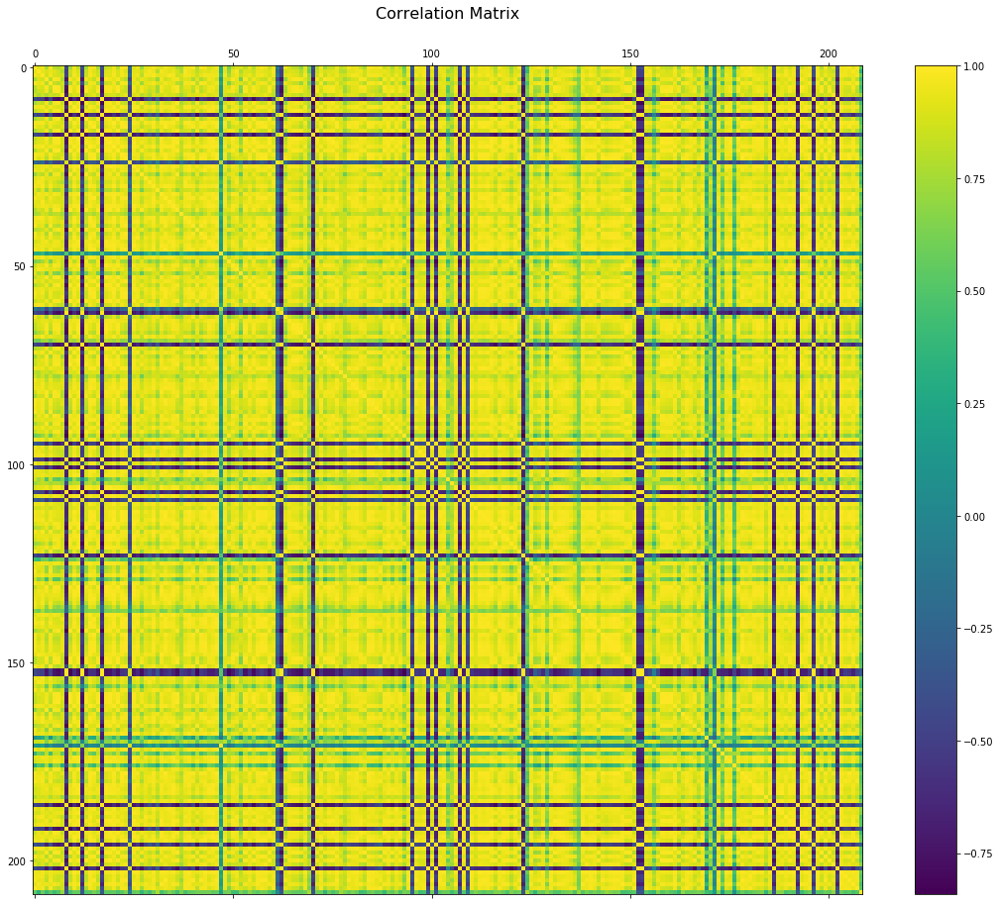

In [69]:
f = plt.figure(figsize=(19, 15))
plt.matshow(pivoted_GDP_df.corr(), fignum=f.number)
cb = plt.colorbar()
cb.ax.tick_params()
plt.title('Correlation Matrix', fontsize=16);

We then try to clusterize this correlation matrix in order to find countries whose GDP are correlated:

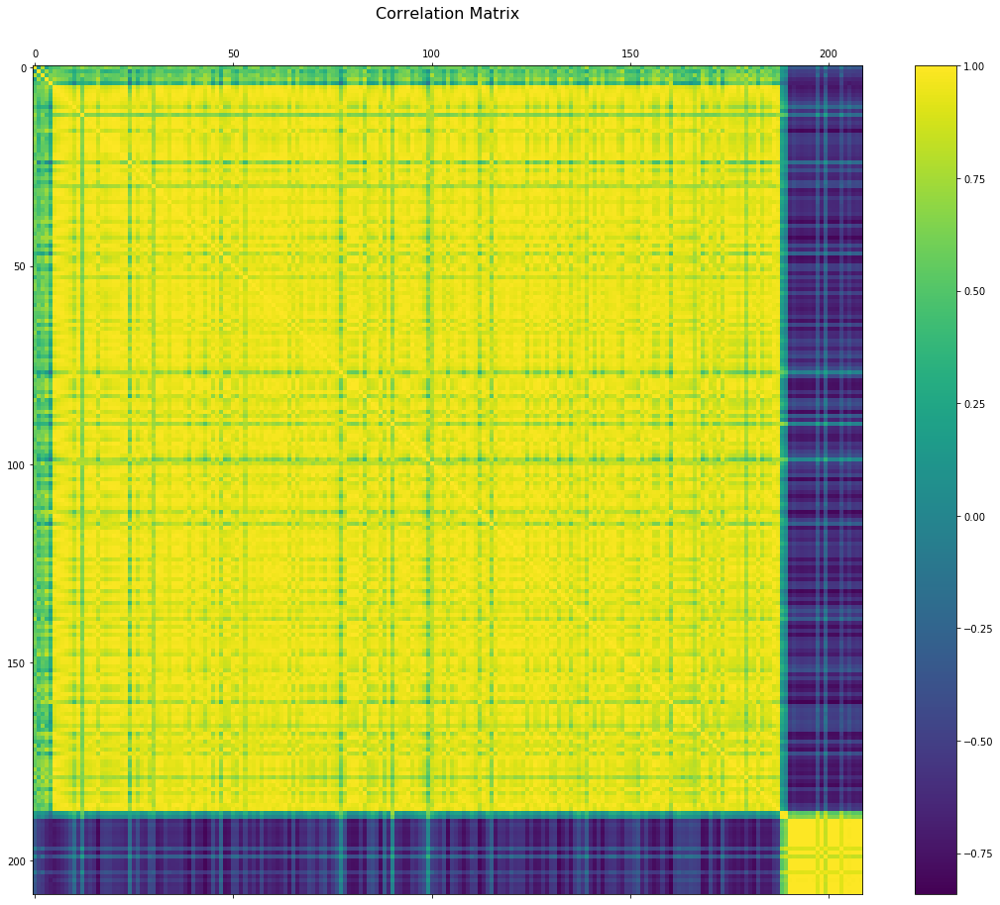

In [70]:
corr = pivoted_GDP_df.corr().values
pdist = spc.distance.pdist(corr)   # vector of ('55' choose 2) pairwise distances
linkage = spc.linkage(pdist, method='complete')
ind = spc.fcluster(linkage, 0.32*pdist.max(), 'distance')
columns = [pivoted_GDP_df.columns.tolist()[i] for i in list((np.argsort(ind)))]
clusterised_df = pivoted_GDP_df.reindex(columns, axis=1)

f = plt.figure(figsize=(19, 15))
plt.matshow(clusterised_df.corr(), fignum=f.number)
cb = plt.colorbar()
cb.ax.tick_params()
plt.title('Correlation Matrix', fontsize=16);

We have found regions in which the GDP is highly correlated and between which the correlation coefficent is lower. We could refine the big clusters by iterating this method.

**Interpretation:** The correlation matrix of GDP contains lots of values that are very closed to one. This means that **GDP in two different countries have a trend to evolve the same way**. Therefore, we can say that the world countries have **strong enough trading relations** to make the GDP evolve the same way. The fact that we have found some **main clusters** could be interpreted as regions in which the **trading relations are more important**.

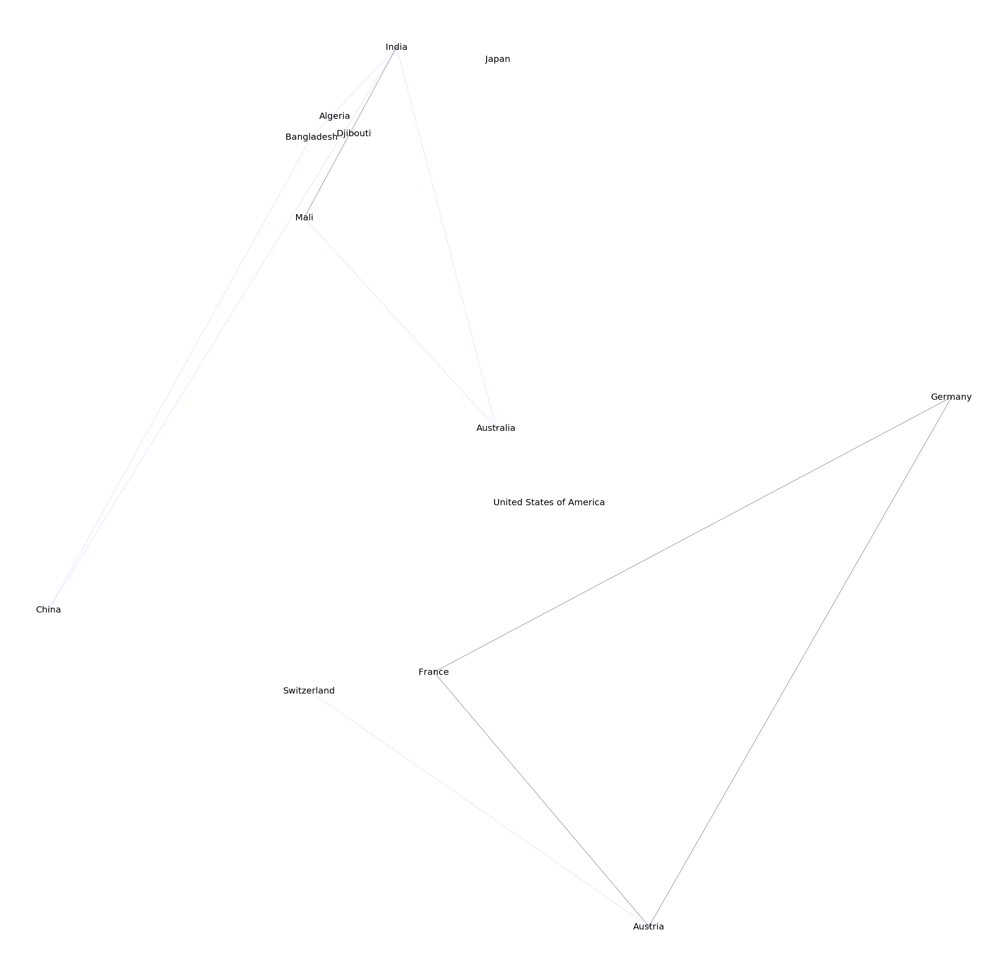

In [135]:
import networkx as nx


plt.figure(figsize=(40,40))

selected_countries = ['Algeria', 'Australia', 'Austria', 'Bangladesh', 'China',
                      'Djibouti', 'France', 'Germany', 'India', 'Japan', 'Mali',
                      'Switzerland', 'United States of America']

G =  nx.from_pandas_adjacency(pivoted_GDP_df[selected_countries].corr())

elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] > 0.99]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if 0.98 < d['weight'] <= 0.99]

pos = nx.spring_layout(G, k=0.01185)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G, pos, node_size=10, node_shape='.')

# edges
nx.draw_networkx_edges(G, pos, edgelist=elarge,
                       width=1, alpha=0.5)
nx.draw_networkx_edges(G, pos, edgelist=esmall,
                       width=1, alpha=0.2, edge_color='b', style='dashed')

# labels
nx.draw_networkx_labels(G, pos, font_size=20, font_family='sans-serif')

plt.axis('off')
plt.show()


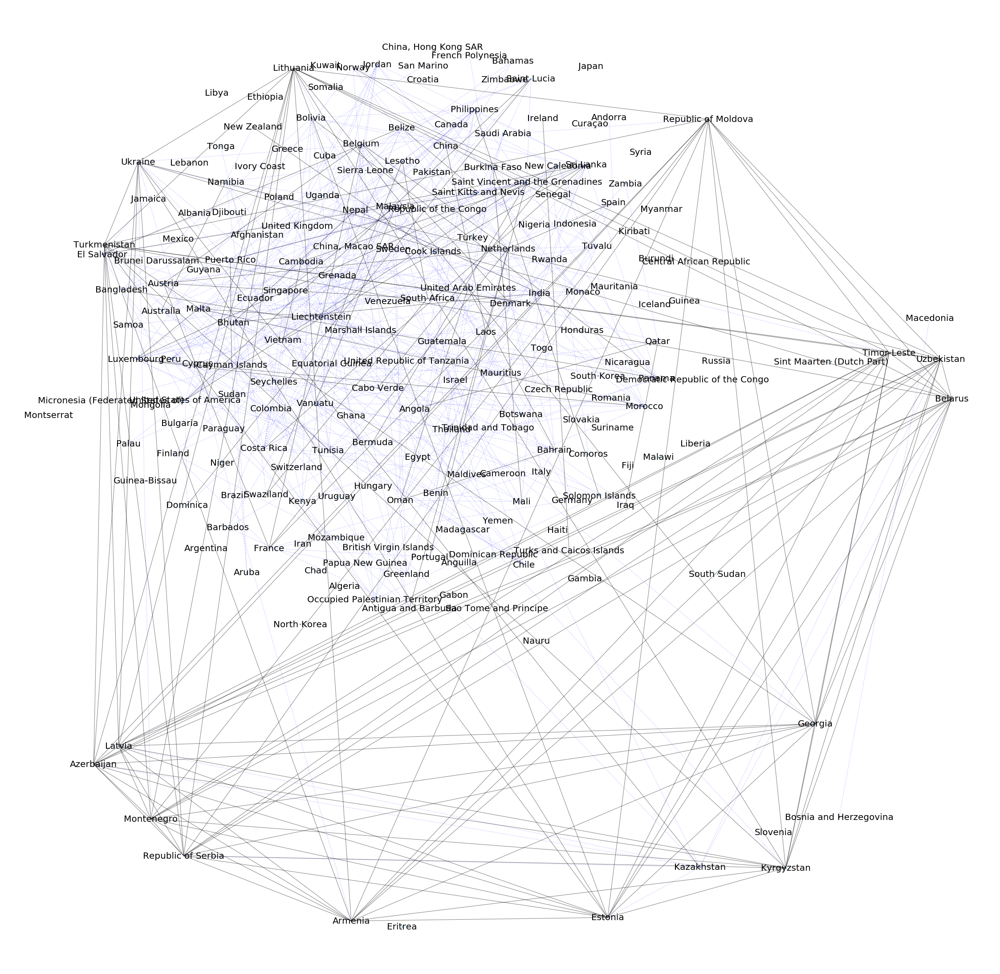

In [111]:
plt.figure(figsize=(40,40))

G =  nx.from_pandas_adjacency(pivoted_GDP_df.corr())

elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] > 0.995]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if 0.99 < d['weight'] <= 0.995]

pos = nx.spring_layout(G, k=2)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G, pos, node_size=10, node_shape='.')

# edges
nx.draw_networkx_edges(G, pos, edgelist=elarge,
                       width=1, alpha=0.5)
nx.draw_networkx_edges(G, pos, edgelist=esmall,
                       width=1, alpha=0.2, edge_color='b', style='dashed')

# labels
nx.draw_networkx_labels(G, pos, font_size=20, font_family='sans-serif')

plt.axis('off')
plt.show()

#### 2.D. Economic classification of countries <a name="2D"></a>
Below, we plot the distribution of GDP over the world for the last decades:

In [136]:
plot = uni_df[['Area','Year']]
plot["Value"] = uni_df["(GDP, million $)"]
interact(lambda x: visualise_world_data_folium(plot,'Value',x),x=(1990,2010,1))

C:\Users\Martin\.conda\envs\ada\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


interactive(children=(IntSlider(value=2000, description='x', max=2010, min=1990), Output()), _dom_classes=('wi…

<function __main__.<lambda>(x)>

The countries with high **GDP** indeed correpond to the most **developped countries**. The **trends we can observe** from those plots look **very significant** (USSR dissolution, China economic growth, ...)

### 3. Descriptive data analysis  <a name="3"></a>

3. 

    1. [Production and consumption of food from a time-space geography point of view](#3A)

    2. [Food self-sufficiency](#3B)

    3. [Analysis of food production and trade with GDP](#3C)
        
        1. [Correlation between production features and GDP](#3Ca)
        
        2. [Correlation between food trade features and GDP](#3Cb)
        
        3. [Machine learning model](#3Cc)  

    4. [Food prices stability and agricultural features](#3D)  
  

#### 3.A. Production and consumption of food from a time-space geography point of view <a name="3A"></a>

For the next milestone, this part will be put to the end of the file and conducted for **specific agricultural features** (e.g. trade of crop most highly correlated to GDP) after the **most important ones** have been **identified**.

In [159]:
#exported items by mass
exports_df = uni_df.filter(like='export quantities tonnes')

#imported items by mass
imports_df= uni_df.filter(like='import quantities tonnes')

display(exports_df.sample(5),imports_df.sample(5))

,"Anise, badian, fennel, coriander Food export quantities tonnes",Apples Food export quantities tonnes,Apricots Food export quantities tonnes,Artichokes Food export quantities tonnes,Asparagus Food export quantities tonnes,Avocados Food export quantities tonnes,Bambara beans Food export quantities tonnes,Bananas Food export quantities tonnes,Barley Food export quantities tonnes,"Beans, dry Food export quantities tonnes",...,Spinach Food export quantities tonnes,Strawberries Food export quantities tonnes,Sugar beet Food export quantities tonnes,"Sugar crops, nes Food export quantities tonnes",Sweet potatoes Food export quantities tonnes,"Tangerines, mandarins, clementines, satsumas Food export quantities tonnes",Tomatoes Food export quantities tonnes,Vetches Food export quantities tonnes,Watermelons Food export quantities tonnes,Wheat Food export quantities tonnes
8789,0.0,26571.0,0.0,0.0,0.0,0.0,0.0,15387.0,1100.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1091.0,1620.0,0.0,6500.0,1113.0
4452,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7803,101.0,482435.0,3701.0,393.0,124.0,50742.0,303.0,7658.0,346.0,6128.0,...,223.0,588.0,8.0,0.0,1979.0,133587.0,24172.0,0.0,1780.0,220015.0
2508,45.0,2561.0,4.0,0.0,4.0,23.0,0.0,600.0,854954.0,219.0,...,18.0,72.0,2.0,0.0,4.0,732.0,3952.0,0.0,874.0,730203.0
6387,2112.0,1.0,10.0,0.0,0.0,0.0,0.0,808.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,24700.0,0.0,0.0,592.0,0.0


,"Anise, badian, fennel, coriander Food import quantities tonnes",Apples Food import quantities tonnes,Apricots Food import quantities tonnes,Artichokes Food import quantities tonnes,Asparagus Food import quantities tonnes,Avocados Food import quantities tonnes,Bambara beans Food import quantities tonnes,Bananas Food import quantities tonnes,Barley Food import quantities tonnes,"Beans, dry Food import quantities tonnes",...,Spinach Food import quantities tonnes,Strawberries Food import quantities tonnes,Sugar beet Food import quantities tonnes,"Sugar crops, nes Food import quantities tonnes",Sweet potatoes Food import quantities tonnes,"Tangerines, mandarins, clementines, satsumas Food import quantities tonnes",Tomatoes Food import quantities tonnes,Vetches Food import quantities tonnes,Watermelons Food import quantities tonnes,Wheat Food import quantities tonnes
5979,0.0,405.0,0.0,0.0,0.0,0.0,0.0,2009.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,634.0,0.0,0.0,77.0
4919,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31583.0
4431,0.0,47.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,36.0,0.0,2.0,0.0,11.0,0.0
7462,13.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,398.0
8600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [162]:
def plot_map_import_export(imported_and_exported_elt):
    exp = imported_and_exported_elt+' Food export quantities tonnes'
    imp = imported_and_exported_elt+' Food import quantities tonnes'
    net_df = pd.concat([uni_df[['Area','Year']],exports_df[exp],imports_df[imp]], axis=1)
    net_df["Value"] = net_df[exp]-net_df[imp]
    net_df["Value"] = np.sign(net_df["Value"]) * np.log(np.abs(net_df["Value"]) + 1) # kind of log scale positive and negative values
    for year in range(1980, 2015, 5):
        display(year, visualise_world_data_folium(net_df, 'Value', year, False, True))

In [167]:
plot_map_import_export('Apples')

1980

1985

1990

1995

2000

2005

2010

In [168]:
plot_map_import_export('Grapes')

1980

1985

1990

1995

2000

2005

2010

In [169]:
plot_map_import_export('Wheat')

1980

1985

1990

1995

2000

2005

2010

In [170]:
plot_map_import_export('Soybeans')

1980

1985

1990

1995

2000

2005

2010

In [171]:
plot_map_import_export('Maize')

1980

1985

1990

1995

2000

2005

2010

#### 3.B. Food self-sufficiency <a name="3B"></a>
In this chapter, we take a look at the self suficiency score of the countries around the world and we focus on the agricultural features identified by our model.

In [137]:

# TO DELETE!!!

weights={'Apples Crops Production tonnes': 0.00038835122755090606,
 'Grapes Crops Production tonnes': 0.043072069534541305,
 'Wheat Food export quantities tonnes': 0.011350728929876288,
 'Soybeans Crops Production tonnes': -0.001271124985250068,
 'Maize Crops Production tonnes': 0.028315846463208876,
 'Turkeys Livestock production Head': 0.0056892714752312225}

In [165]:
scores=compute_self_suficiency(uni_df,weights=weights)
scores=scores.reset_index()
interact(lambda x : visualise_world_data_folium(scores,'Agg',x,log=False,log2=True), x=(1960,2011,1))

interactive(children=(IntSlider(value=1985, description='x', max=2011, min=1960), Output()), _dom_classes=('wi…

<function __main__.<lambda>(x)>

#### 3.C. Analysis of food production and trade with GDP <a name="3C"></a>

##### 3.C.a. Food production and GDP <a name="3Ca"></a>

Out of the crops and the livestock produced, we will **focus on the top 20 crops** as well as **top 20 livestock produced globally** to be able to have a **model with a reasonable amount of features**. 

In [139]:
#Choose the top 20 crops produced in the world for the first model
crop_production_df= uni_df.filter(like='Crops Production tonnes') 
crop_production_df = crop_production_df.sum(axis=0).sort_values(ascending=False)
crop_production_list = crop_production_df.index.tolist()[:20]
crop_production_list.insert(0,'(GDP, million $)')
crop_production_list
#Take the top 20 crops and the columns of our uni_df which contain their production
maincrops_df = uni_df[crop_production_list]

#Livestock
livestock_production_df= uni_df.filter(like='Livestock production') 
livestock_production_df = livestock_production_df.sum(axis=0).sort_values(ascending=False)
livestock_production_list = livestock_production_df.index.tolist()[:20]
livestock_production_list.insert(0,'(GDP, million $)')
livestock_production_list
#Take the top 20 crops and the columns of our uni_df which contain their production
mainlivestock_df = uni_df[livestock_production_list]

top_production_list = crop_production_list +livestock_production_list[1:]

top_production_df = uni_df[top_production_list]
top_production_df.head(5)

,"(GDP, million $)",Wheat Crops Production tonnes,Potatoes Crops Production tonnes,Sugar beet Crops Production tonnes,Maize Crops Production tonnes,Barley Crops Production tonnes,Cassava Crops Production tonnes,Oats Crops Production tonnes,Tomatoes Crops Production tonnes,Soybeans Crops Production tonnes,...,Rabbits and hares Livestock production Head,Buffaloes Livestock production Head,Horses Livestock production Head,Asses Livestock production Head,"Pigeons, other birds Livestock production Head",Camels Livestock production Head,"Rodents, other Livestock production Head",Mules Livestock production Head,"Camelids, other Livestock production Head",Animals live nes Livestock production Head
0,1748.886597,2081000.0,144000.0,62000.0,667000.0,370000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,415000.0,1300000.0,0.0,300000.0,0.0,35000.0,0.0,0.0
1,1831.108982,1915000.0,167000.0,60000.0,670000.0,355000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,415000.0,1300000.0,0.0,300000.0,0.0,35000.0,0.0,0.0
2,1595.555482,2450000.0,158000.0,63300.0,720000.0,350000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,369000.0,1300000.0,0.0,300000.0,0.0,31000.0,0.0,0.0
3,1733.333275,2700000.0,165000.0,57000.0,760000.0,360000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,370000.0,1250000.0,0.0,300000.0,0.0,26500.0,0.0,0.0
4,2155.555500,2750000.0,182000.0,66600.0,770000.0,380000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,370000.0,1250000.0,0.0,300000.0,0.0,26500.0,0.0,0.0


In [140]:
#Checking correlations of main crops between each other and with GDP
top_production_correlation_matrix = round (top_production_df.corr(method='pearson'),3)
top_production_correlation_matrix['(GDP, million $)'].sort_values(ascending = False)

(GDP, million $)                                        1.000
Maize Crops Production tonnes                           0.779
Turkeys Livestock production Head                       0.677
Soybeans Crops Production tonnes                        0.651
Chickens Livestock production Head                      0.554
Tomatoes Crops Production tonnes                        0.542
Apples Crops Production tonnes                          0.454
Onions, dry Crops Production tonnes                     0.448
Grapes Crops Production tonnes                          0.422
Oranges Crops Production tonnes                         0.418
Sorghum Crops Production tonnes                         0.398
Horses Livestock production Head                        0.383
Pigs Livestock production Head                          0.382
Wheat Crops Production tonnes                           0.381
Watermelons Crops Production tonnes                     0.348
Cattle Livestock production Head                        0.342
Cabbages

Because "Cereals (Rice Milled Eqv) Crops Production tonnes" has such a high correlation with a lot of other features, it is **probably an aggregate of them** (eg over 90% with wheat).

We would know like to look at some **relationships between these measures and the GDP**:

C:\Users\Martin\.conda\envs\ada\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


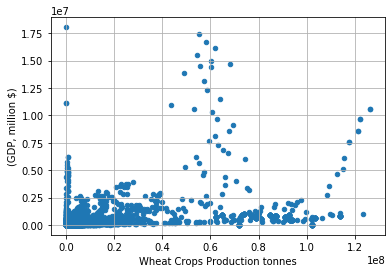

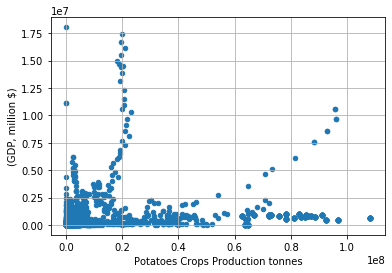

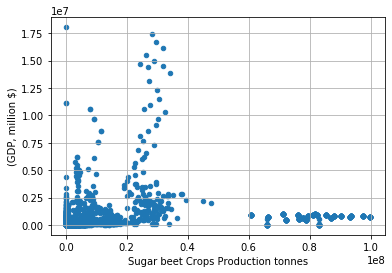

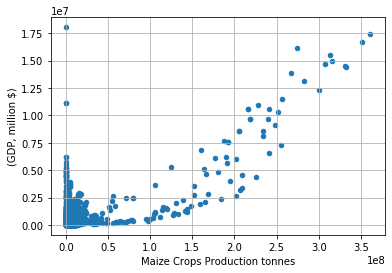

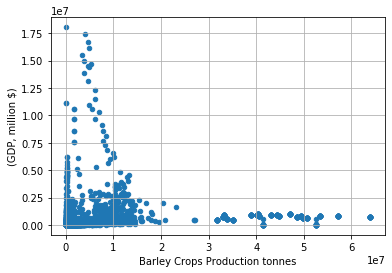

...

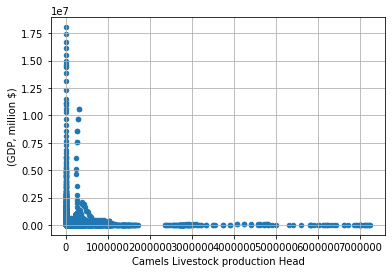

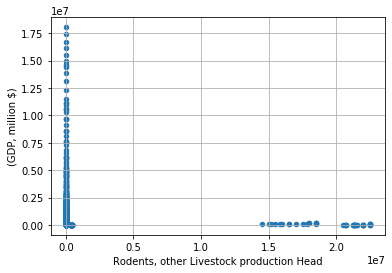

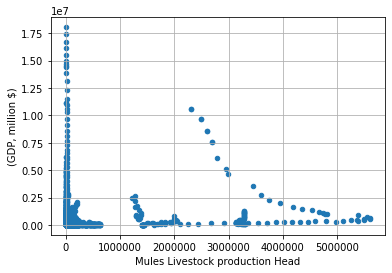

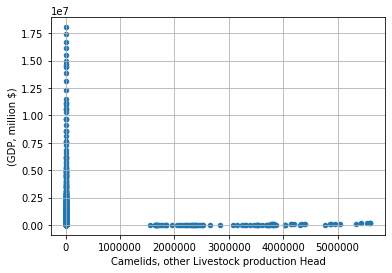

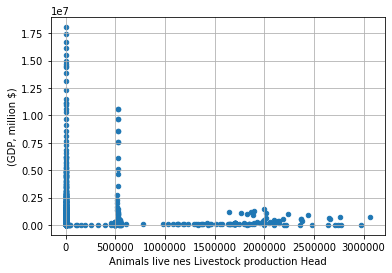

In [141]:
#Looking at some relationships
for item in list(top_production_df.columns)[1:]:
    top_production_df.plot(kind='scatter', x=item, y='(GDP, million $)', grid=True)


We can quite clearly see that the production of many of the most popular crops can well be related to GDP.

##### 3.C.b. Trade and GDP <a name="3Cb"></a>

Let's see if the same can be said about the most exported/imported goods.

In [142]:
#Choose the top 20 most exported items by mass
top_exports_df= uni_df.filter(like='export quantities tonnes')
top_exports_df = top_exports_df.sum(axis=0).sort_values(ascending=False)
top_exports_list =top_exports_df.index.tolist()[:20]
top_exports_list

#Take the top 20 exported crops and the columns of our uni_df which contain their production
top_exports_list.insert(0,'(GDP, million $)')
top_exports_df = uni_df[top_exports_list]


#Choose the top 20 most imported items by mass
top_imports_df= uni_df.filter(like='import quantities tonnes')
top_imports_df = top_imports_df.sum(axis=0).sort_values(ascending=False)

top_imports_list =top_imports_df.index.tolist()[:20]
top_imports_list

#Take the top 20 imported items and the columns of our uni_df which contain their production
top_imports_list.insert(0,'(GDP, million $)')
top_imports_df = uni_df[top_imports_list]

#Create a joined list
top_traded_list = top_exports_list +top_imports_list[1:]

In [143]:
top_traded_df = uni_df[top_traded_list]
top_traded_df.sample(5)

,"(GDP, million $)",Wheat Food export quantities tonnes,Maize Food export quantities tonnes,Soybeans Food export quantities tonnes,Barley Food export quantities tonnes,"Oil, palm Food export quantities tonnes",Bananas Food export quantities tonnes,Sorghum Food export quantities tonnes,Potatoes Food export quantities tonnes,Rapeseed Food export quantities tonnes,...,Rapeseed Food import quantities tonnes,"Coffee, green Food import quantities tonnes",Tomatoes Food import quantities tonnes,Oats Food import quantities tonnes,"Onions, dry Food import quantities tonnes","Cocoa, beans Food import quantities tonnes",Rye Food import quantities tonnes,Grapes Food import quantities tonnes,"Peas, dry Food import quantities tonnes",Lemons and limes Food import quantities tonnes
4137,308767.245990,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5501,11757.941108,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5345,447637.117240,401513.0,131938.0,1633.0,0.0,19.0,240230.0,63.0,2399.0,3.0,...,562323.0,10669.0,25872.0,52894.0,36627.0,1760.0,133.0,37345.0,12964.0,3169.0
6705,66017.767865,90.0,0.0,0.0,13064.0,0.0,0.0,0.0,425458.0,421058.0,...,0.0,28387.0,2888.0,0.0,0.0,24068.0,29442.0,6296.0,0.0,45533.0
9722,8333.937797,0.0,495171.0,0.0,10.0,0.0,2.0,93.0,1466.0,0.0,...,0.0,0.0,0.0,0.0,0.0,40.0,0.0,0.0,0.0,0.0


We now check the **correlations** of main traded goods **with GDP**:

In [144]:
top_traded_correlation_matrix = round (top_traded_df.corr(method='pearson'),3)
top_traded_correlation_matrix['(GDP, million $)'].sort_values(ascending = False)

(GDP, million $)                                                              1.000
Bananas Food import quantities tonnes                                         0.763
Coffee, green Food import quantities tonnes                                   0.676
Oats Food import quantities tonnes                                            0.674
Tomatoes Food import quantities tonnes                                        0.655
Grapes Food import quantities tonnes                                          0.628
Soybeans Food export quantities tonnes                                        0.607
Maize Food export quantities tonnes                                           0.605
Lemons and limes Food import quantities tonnes                                0.604
Wheat Food export quantities tonnes                                           0.531
Cocoa, beans Food import quantities tonnes                                    0.509
Sorghum Food export quantities tonnes                                       

It seems that the highest correlations can be found from **exports of meat as well** as **feeding stuff**. 

We would know like to look at some **relationships between these measures and the GDP**:

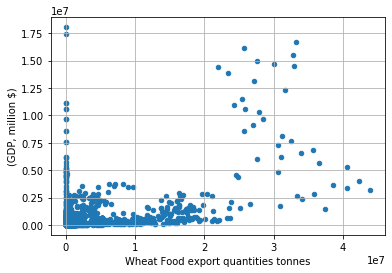

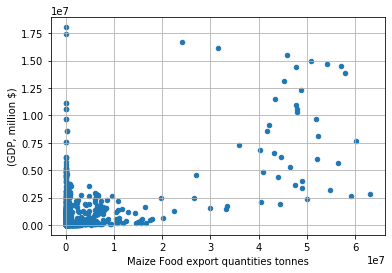

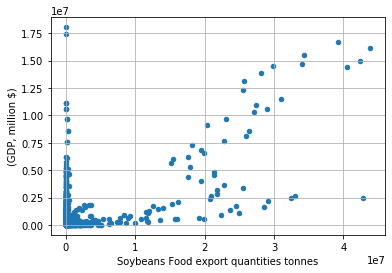

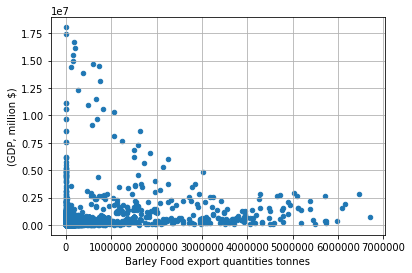

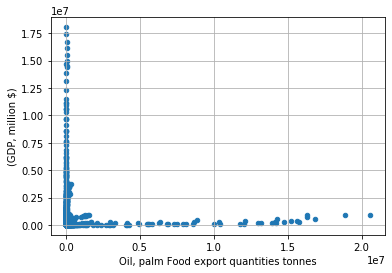

...

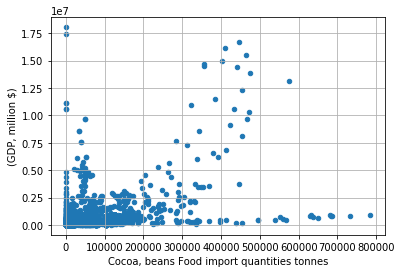

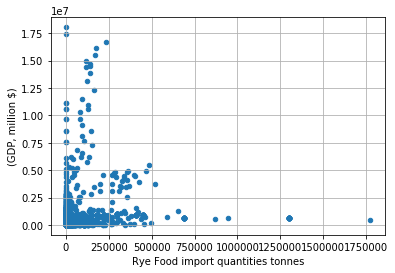

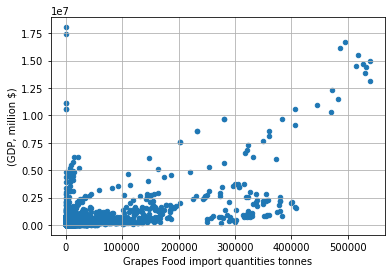

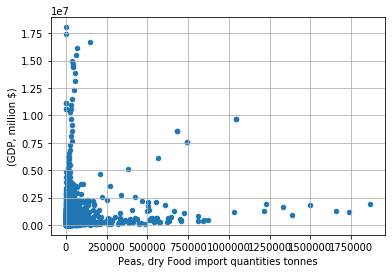

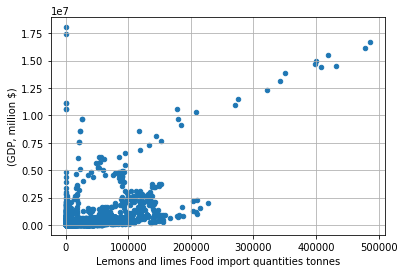

In [145]:
for item in list(top_traded_df.columns)[1:]:
    top_traded_df.plot(kind='scatter', x=item, y='(GDP, million $)', grid=True)

##### 3.C.c. Machine learning model <a name="3Cc"></a>

3. 

    3. 
        
        3. 
        
            1. [Model - based on trade](#3Cci)  
        
            2. [Model - based on production](#3Ccii) 

###### 3.C.c.i. Model - based on production <a name="3Cci"></a>

First, we only create a model using **only the production data**. Afterwards, we use the data on exports, imports. 

#### Standardization, scaling


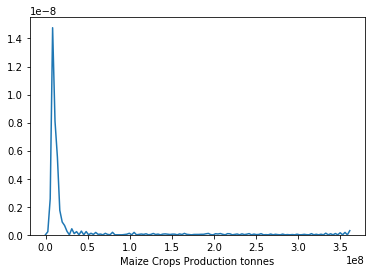

In [146]:
_ = sns.distplot(top_production_df["Maize Crops Production tonnes"], rug=False, hist=False)

C:\Users\Martin\.conda\envs\ada\lib\site-packages\pandas\core\series.py:856: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


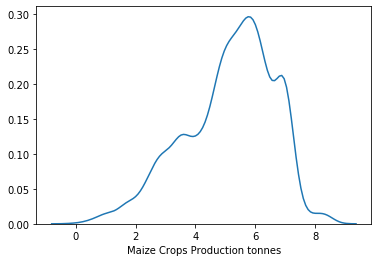

In [147]:
_ = sns.distplot(np.log10(top_production_df["Maize Crops Production tonnes"]), rug=False, hist=False)

We notice that the production of goods, just as the GDP, has a more "normal looking" distribution when we use the logscale. We will thus create a new uniformed dataframe, with applying the logarithm to all values.

In [148]:
#Using 1+x so as to keep 0 values to 0.
def log(x):
    return np.log10(1+x)

In [149]:
#create a new dataframe with log values, so that we have normal distributions for later analysis
uni_df_log = uni_df.copy()
uni_df_log.iloc[:,2:] = uni_df_log.iloc[:,2:].apply(lambda x : log(x))

C:\Users\Martin\.conda\envs\ada\lib\site-packages\pandas\core\series.py:856: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [150]:
top_production_log_df = uni_df_log[top_production_list]
top_production_log_df.sample(5)

,"(GDP, million $)",Wheat Crops Production tonnes,Potatoes Crops Production tonnes,Sugar beet Crops Production tonnes,Maize Crops Production tonnes,Barley Crops Production tonnes,Cassava Crops Production tonnes,Oats Crops Production tonnes,Tomatoes Crops Production tonnes,Soybeans Crops Production tonnes,...,Rabbits and hares Livestock production Head,Buffaloes Livestock production Head,Horses Livestock production Head,Asses Livestock production Head,"Pigeons, other birds Livestock production Head",Camels Livestock production Head,"Rodents, other Livestock production Head",Mules Livestock production Head,"Camelids, other Livestock production Head",Animals live nes Livestock production Head
1108,4.039261,2.021189,0.0,0.0,3.952696,0.0,0.000000,0.0,0.000000,0.0,...,5.041397,0.000000,4.582802,5.518515,0.000000,0.0,0.0,3.477266,0.0,0.000000
5211,2.065311,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000
281,1.936597,0.000000,0.0,0.0,1.785330,0.0,1.591065,0.0,1.986772,0.0,...,0.000000,0.000000,2.764176,3.278982,0.000000,0.0,0.0,0.000000,0.0,0.000000
828,2.326131,0.000000,0.0,0.0,4.208414,0.0,0.000000,0.0,0.000000,0.0,...,0.000000,0.000000,3.699057,0.000000,0.000000,0.0,0.0,3.643551,0.0,0.000000
1783,5.080465,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,1.491362,0.0,...,0.000000,1.908485,3.158664,0.000000,6.818028,0.0,0.0,0.000000,0.0,5.698971


In [151]:
#We then normalize the data, so as to have comparable ranges. We use the dataframe of log values.

top_production_values = top_production_log_df.values
standard_scaler = preprocessing.StandardScaler()
top_production_stand_values =standard_scaler.fit_transform(top_production_values)
top_production_stand = pd.DataFrame(top_production_stand_values, columns=top_production_log_df.columns)
top_production_stand.sample(5)

,"(GDP, million $)",Wheat Crops Production tonnes,Potatoes Crops Production tonnes,Sugar beet Crops Production tonnes,Maize Crops Production tonnes,Barley Crops Production tonnes,Cassava Crops Production tonnes,Oats Crops Production tonnes,Tomatoes Crops Production tonnes,Soybeans Crops Production tonnes,...,Rabbits and hares Livestock production Head,Buffaloes Livestock production Head,Horses Livestock production Head,Asses Livestock production Head,"Pigeons, other birds Livestock production Head",Camels Livestock production Head,"Rodents, other Livestock production Head",Mules Livestock production Head,"Camelids, other Livestock production Head",Animals live nes Livestock production Head
911,-1.037916,-1.035486,-0.263059,-0.589535,-1.460893,-0.862156,-0.809476,-0.680859,-0.467446,-0.753591,...,-0.583305,-0.495610,-0.272323,-0.775724,-0.212781,-0.534925,-0.095664,-0.393469,-0.096469,-0.160053
3363,0.497534,1.112244,0.879029,1.694541,0.736508,1.235380,-0.809476,1.348677,1.092975,-0.753591,...,1.784955,1.207235,0.777104,1.183523,4.516801,-0.534925,-0.095664,1.751894,-0.096469,-0.160053
8726,0.052713,0.371258,0.786927,-0.589535,0.863703,-0.862156,1.816836,-0.680859,0.370228,1.491863,...,-0.583305,-0.495610,-1.503415,0.678770,-0.212781,-0.534925,-0.095664,-0.775277,-0.096469,-0.160053
5988,-0.276838,-1.035486,-1.337898,-0.589535,-1.460893,-0.862156,-0.809476,-0.680859,-1.440690,-0.753591,...,-0.583305,-0.495610,-1.503415,0.335525,-0.212781,-0.534925,-0.095664,-0.775277,-0.096469,-0.160053
4053,0.056281,0.750189,0.902559,1.590331,-1.460893,1.231979,-0.809476,1.386337,0.410842,-0.753591,...,-0.583305,-0.495610,0.654561,0.794303,-0.212781,-0.534925,-0.095664,0.844513,-0.096469,-0.160053


In [152]:
train_set, test_set = train_test_split(top_production_stand.values, test_size = 0.2, random_state = 1)

X_train_set = train_set[:,1:]
Y_train_set = train_set[:,0]

X_test_set = test_set[:,1:]
Y_test_set = test_set[:,0]

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:02<00:00, 16.02it/s]


The best value obtained is for alpha equal to 1.18 with a MSE of 0.3734825463001695


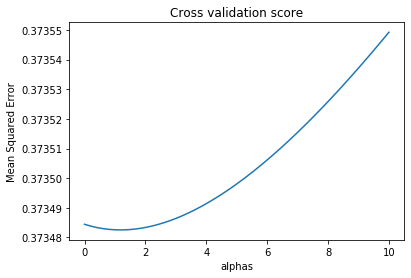

In [153]:
number_of_folds = 5
scores = []
list_of_alpha = [i for i in np.arange(0,10,0.01)]
for alpha in tqdm(list_of_alpha):
    clf = Ridge(alpha = alpha)
    score = cross_val_score(clf, X_train_set, Y_train_set, cv=number_of_folds, scoring = 'neg_mean_squared_error')
    scores.append([alpha, score.mean()])
a=np.array(scores)
best_alpha = a[np.where(a==np.amax(a[:,1]))[0]][0,0]
print("The best value obtained is for alpha equal to " + str(best_alpha) + " with a MSE of "+ str(-a[np.where(a==np.amax(a[:,1]))[0]][0,1]))
alphas = [elt[0] for elt in scores]
MSE = [-elt[1] for elt in scores]
sns.lineplot(alphas, MSE)
_ = plt.title("Cross validation score")
_ = plt.ylabel("Mean Squared Error")
_ = plt.xlabel("alphas")

In [154]:
# We build our model with the chosen alpha.
model_top_production = Ridge(alpha=best_alpha)
model_top_production.fit(X_train_set, Y_train_set)

Ridge(alpha=1.18, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [155]:
weights_top_production = pd.DataFrame([model_top_production.coef_], columns=top_production_df.columns[1:])
weights_top_production = weights_top_production.sort_values(by=0, axis=1, ascending=False)                                  
weights_top_production

,"Rodents, other Livestock production Head",Tomatoes Crops Production tonnes,Cabbages and other brassicas Crops Production tonnes,Sheep Livestock production Head,Rye Crops Production tonnes,Soybeans Crops Production tonnes,Goats Livestock production Head,Wheat Crops Production tonnes,Chickens Livestock production Head,Horses Livestock production Head,...,Mules Livestock production Head,Camels Livestock production Head,Rabbits and hares Livestock production Head,Bananas Crops Production tonnes,Apples Crops Production tonnes,Maize Crops Production tonnes,Asses Livestock production Head,Pigs Livestock production Head,Sheep and Goats Livestock production Head,"Camelids, other Livestock production Head"
0,0.344828,0.195817,0.191164,0.175637,0.156657,0.133605,0.128343,0.124493,0.123947,0.104957,...,-0.035504,-0.040012,-0.048611,-0.076524,-0.112902,-0.114091,-0.139308,-0.17409,-0.312265,-0.373351


In [156]:
model_top_production.score(X_train_set, Y_train_set)

0.6284228971815244

Results are so far middling, but it also need cleaning since there's some aggregate values (e.g. including "total" in their name, that need to be removed). We will continue working on this for next milestone.

###### 3.C.c.ii. Model - based on trade <a name="3Ccii"></a>

In [157]:
#Use dataframe with log values
top_traded_log_df = uni_df_log[top_traded_list]

In [158]:
#We then normalize the data, so as to have comparable ranges. We use the dataframe of log values.

top_traded_values = top_traded_log_df.values
standard_scaler = preprocessing.StandardScaler()
top_traded_stand_values =standard_scaler.fit_transform(top_traded_values)
top_traded_stand = pd.DataFrame(top_production_stand_values, columns=top_traded_log_df.columns)
top_traded_stand.sample(5)

ValueError: Shape of passed values is (9755, 39), indices imply (9755, 41)

In [ ]:
train_set, test_set = train_test_split(top_traded_stand.values, test_size = 0.2, random_state = 1)

X_train_set = train_set[:,1:]
Y_train_set = train_set[:,0]

X_test_set = test_set[:,1:]
Y_test_set = test_set[:,0]

In [ ]:
number_of_folds = 5
scores = []
list_of_alpha = [i for i in np.arange(0,10,0.01)]
for alpha in tqdm(list_of_alpha):
    clf = Ridge(alpha = alpha)
    score = cross_val_score(clf, X_train_set, Y_train_set, cv=number_of_folds, scoring = 'neg_mean_squared_error')
    scores.append([alpha, score.mean()])
a=np.array(scores)
best_alpha = a[np.where(a==np.amax(a[:,1]))[0]][0,0]
print("The best value obtained is for alpha equal to " + str(best_alpha) + " with a MSE of "+ str(-a[np.where(a==np.amax(a[:,1]))[0]][0,1]))
alphas = [elt[0] for elt in scores]
MSE = [-elt[1] for elt in scores]
sns.lineplot(alphas, MSE)
_ = plt.title("Cross validation score")
_ = plt.ylabel("Mean Squared Error")
_ = plt.xlabel("alphas")

In [ ]:
# We build our model with the chosen alpha.
model_trade = Ridge(alpha=best_alpha)
model_trade.fit(X_train_set, Y_train_set)

In [ ]:
weights_trade = pd.DataFrame([model_trade.coef_], columns=top_traded_stand.columns[1:])
weights_trade = weights_trade.sort_values(by=0, axis=1, ascending=False)                                  
weights_trade

In [ ]:
model_trade.score(X_train_set, Y_train_set)

This models also needs to be cleaned, because the one with lowest weights is actually a part of the one with highest. 

But it seems we can already draw some **conclusions**: **cake, soybeans, as well as oilseed cake meal food and fodder & Feeding stuff** are all used as animal feed. The fact that they're among the **features with the highest weights** clearly indicates that there's **a link between GDP and high amounts of imports of animal feed**. 

#### 3.D. Food prices stability and agricultural features <a name="3D"></a>

In [ ]:
#creating the matrices starting from 2000
top_production_list.insert(1,'(Consumer price indices, %)')
top_traded_list.insert(1,'(Consumer price indices, %)')
top_production_2000_df = uni_df_2000[top_production_list]
top_traded_2000_df = uni_df_2000[top_traded_list]

In [ ]:
#Checking correlations of main crops between each other and CPI
top_production_correlation_matrix = round (top_production_2000_df.corr(method='pearson'),3)
top_production_correlation_matrix['(Consumer price indices, %)'].sort_values(ascending = False)

In [ ]:
top_traded_correlation_matrix = round (top_traded_2000_df.corr(method='pearson'),3)
top_traded_correlation_matrix['(Consumer price indices, %)'].sort_values(ascending = False)

### 4. Informed plan for next actions  <a name="4"></a>

With **clean dataframes** we can now really focus on **producing some interesting results**. Our initial idea was to observe the **effects of different crops and food items on the economic growth** of the countries as well as the **differences in self-sufficiency**. Along the exploration of the data, we turned our attention toward prediction models. Training a **Ridge model** on our data will allow us to identify the **agricultural products** that are the **most correlated** with the **economic growth** of countries (predict the GDP based on agricultural features). The second model (prediction of the CPI variation rate) will allow us to identify **products linked with economic stability**.  

The identification of such items would give an **interesting insight toward understanding geopolotical strategies and challenges**. Further insight might be gained by identifying **who** the producers of these "economically strong" crops and animal products are and visualising the **geographical repartition of the most important ressources**. 

Our objectives for the following weeks are:
1. Revise the order of analysis - for instance putting net food exporters and importers at the end of the notebook. 
2. Fine tune our machine learning models by finding satisfying and meaningful ways to normalise the data without introducing bias, by doing a meaningful parameter optimisation and by removing aggregation variables such as "Rice-total".
3. Identify the "strong" agricultural products.
4. Find a clean way to calculate price stability with the given CPI values.
5. Create a model for price stability and correlating it to different agricultural products.
6. Identify the products we want to use for the self-sufficiency calculation.
7. Compute the correlation between price stability and self-sufficiency.
8. Visualise the repartition of the production of "strong" products as well as their trading flow (who buys, who sells).
9. Share our results in the form of a data story.